<a href="https://colab.research.google.com/github/PhD-Gabriel-Caballero/ESA-summer-school-2023-Croatia/blob/main/Fusing%20radar%20and%20optical%20time%20series%20data%20with%20Multi-output%20Gaussian%20process%20regression%20(MOGPR)%20using%20Google%20Earth%20Engine.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Fusing radar and optical time series data with Multi-output Gaussian process regression (MOGPR) using Google Earth Engine

---

This Jupyter notebook contains all the necessary information for Sentinel-1 and Sentinel-2 data fusing using MOGPR in the Google Earth (GEE) cloud computing platform. This material has been created exclusively for the 2023 European Space Agency (ESA) summer school.

---

Credits and references

[1]   Caballero, G.; Pezzola, A.; Winschel, C.; Sanchez Angonova, P.; Casella, A.; Orden, L.; Salinero-Delgado, M.; Reyes-Muñoz, P.; Berger, K.; Delegido, J.; et al. Synergy of Sentinel-1 and Sentinel-2 Time Series for Cloud-Free Vegetation Water Content Mapping with Multi-Output Gaussian Processes. Remote Sens. 2023, 15, 1822. https://doi.org/10.3390/rs15071822

[2]   Caballero, G.; Pezzola, A.; Winschel, C.; Casella, A.; Sanchez Angonova, P.; Orden, L.; Berger, K.; Verrelst, J.; Delegido, J. Quantifying Irrigated Winter Wheat LAI in Argentina Using Multiple Sentinel-1 Incidence Angles. Remote Sens. 2022, 14, 5867. https://doi.org/10.3390/rs14225867

[3]   Caballero G, Pezzola A, Winschel C, Casella A, Sanchez Angonova P, Rivera-Caicedo JP, Berger K, Verrelst J, Delegido J. Seasonal Mapping of Irrigated Winter Wheat Traits in Argentina with a Hybrid Retrieval Workflow Using Sentinel-2 Imagery. Remote Sensing. 2022; 14(18):4531. https://doi.org/10.3390/rs14184531







**Theoretical background**

Radar vegetation index (RVI) definition:

The Radar Vegetation Index (RVI) is an established metric of vegetation cover. It uses measured scattering intensities from co- and cross-polarization, normalized to ideally range from 0 to 1 with increasing vegetation cover (Kim et al., 2012).

For each Sentinel-1 scene, the dual-pol RVI can be initially generated as follows:

\begin{equation}
RVI=\frac{4VH}{VH+VV}
\end{equation}

Kim, Y.; Jackson, T.; Bindlish, R.; Lee, H.; Hong, S. Radar Vegetation Index for Estimating the Vegetation Water Content of Rice and Soybean. IEEE Geosci. Remote Sens. Lett. 2012, 9, 564–568

### Tracking Radar Vegetation Index (Agriculture Development) Script

[Link to script](https://custom-scripts.sentinel-hub.com/custom-scripts/sentinel-1/sar_rvi_temporal_analysis/)

**General description of the script**

The script analyses and compares the RVI values using all available radar images. The script calculates the average RVI for the current and previous 2 months and takes the current image as the reference.

**Author of the script**
Valters Zeizis

**Evaluate and visualize**

[Sentinel Playground Temporal](https://apps.sentinel-hub.com/sentinel-playground-temporal/?source=S1-AWS-IW-VVVH&lat=46.548944380517646&lng=38.01544189453125&zoom=11&preset=CUSTOM&layers=VV,VH,HH&maxcc=20&gain=1.0&gamma=1.0&time=2017-01-01%7C2019-07-30&atmFilter=ATMCOR&showDates=false&evalscript=Ly9WRVJTSU9OPTMgKGF1dG8tY29udmVydGVkIGZyb20gMSkKZnVuY3Rpb24gc2V0dXAoKSB7CiAgcmV0dXJuIHsKICAgIGlucHV0OiBbewogICAgICBiYW5kczogWwogICAgICAgICAgICAgICAgICAiVlYiLAogICAgICAgICAgIlZIIgogICAgICBdCiAgICB9XSwKICAgIG91dHB1dDogeyBiYW5kczogMyB9LAogICAgbW9zYWlja2luZzogIk9SQklUIgogIH0KfQoKCmZ1bmN0aW9uIGNhbGNSVkkoc2FtcGxlKSB7CiAgdmFyIGRlbm9tID0gc2FtcGxlLlZIKjIrc2FtcGxlLlZWKjI7CiAgcmV0dXJuICgoZGVub20hPTApID8gKHNhbXBsZS5WSCo4KSAvIGRlbm9tIDogMC4wKTsKfQpmdW5jdGlvbiAgc3RyZXRjaCh2YWwsIG1pbiwgbWF4KSAgewogcmV0dXJuICh2YWwtbWluKS8obWF4LW1pbik7Cn0KCmZ1bmN0aW9uIGV2YWx1YXRlUGl4ZWwoc2FtcGxlcyxzY2VuZXMpIHsgIAogIHZhciBhdmcxID0gMC4yOwogIHZhciBjb3VudDEgPSAwOwogIHZhciBhdmcyID0gMC4yOwogIHZhciBjb3VudDIgPSAwOwogIHZhciBhdmczID0gMC4yOwogIHZhciBjb3VudDMgPSAwOwogIHZhciBlbmRNb250aCA9IHNjZW5lc1swXS5kYXRlLmdldE1vbnRoKCk7CiAgCiAgZm9yICh2YXIgaT0wO2k8c2FtcGxlcy5sZW5ndGg7aSsrKSB7CiAgICAgIHZhciBydmkgID0gY2FsY1JWSShzYW1wbGVzW2ldKTsKICAgICAgaWYgKHNjZW5lc1tpXS5kYXRlLmdldE1vbnRoKCk9PWVuZE1vbnRoKQogICAgICB7CgkJYXZnMyA9IGF2ZzMgKyBydmk7CiAgICAgICAgY291bnQzKys7CiAgICAgIH0KICAgICAgZWxzZSBpZiAoc2NlbmVzW2ldLmRhdGUuZ2V0TW9udGgoKT09KGVuZE1vbnRoLTEpKQogICAgICB7CgkJYXZnMiA9IGF2ZzIgKyBydmk7CiAgICAgICAgY291bnQyKys7CiAgICAgIH0KICAgICAgZWxzZQogICAgICB7ICAgICAgCgkJYXZnMT0gYXZnMSArIHJ2aTsKICAgICAgICBjb3VudDErKzsKICAgICAgfQogICAgICAKICB9CiAgYXZnMSA9IGF2ZzEvY291bnQxOwogIGF2ZzIgPSBhdmcyL2NvdW50MjsKICBhdmczID0gYXZnMy9jb3VudDM7CiAgYXZnMSA9IHN0cmV0Y2goYXZnMSwgMC4yNSwgMC43NSk7CiAgYXZnMiA9IHN0cmV0Y2goYXZnMiwgMC4yNSwgMC43NSk7CiAgYXZnMyA9IHN0cmV0Y2goYXZnMywgMC4yNSwgMC43NSk7CiAgCiAgcmV0dXJuIFthdmcxLGF2ZzIsYXZnM107CgoKfQpmdW5jdGlvbiBmaWx0ZXJTY2VuZXMgKHNjZW5lcywgaW5wdXRNZXRhZGF0YSkgewogICAgcmV0dXJuIHNjZW5lcy5maWx0ZXIoZnVuY3Rpb24gKHNjZW5lKSB7CgkgIHJldHVybiBzY2VuZS5kYXRlLmdldFRpbWUoKT49KGlucHV0TWV0YWRhdGEudG8uZ2V0VGltZSgpLTMqMzEqMjQqMzYwMCoxMDAwKSA7CiAgICB9KTsKfQoK&temporal=true)

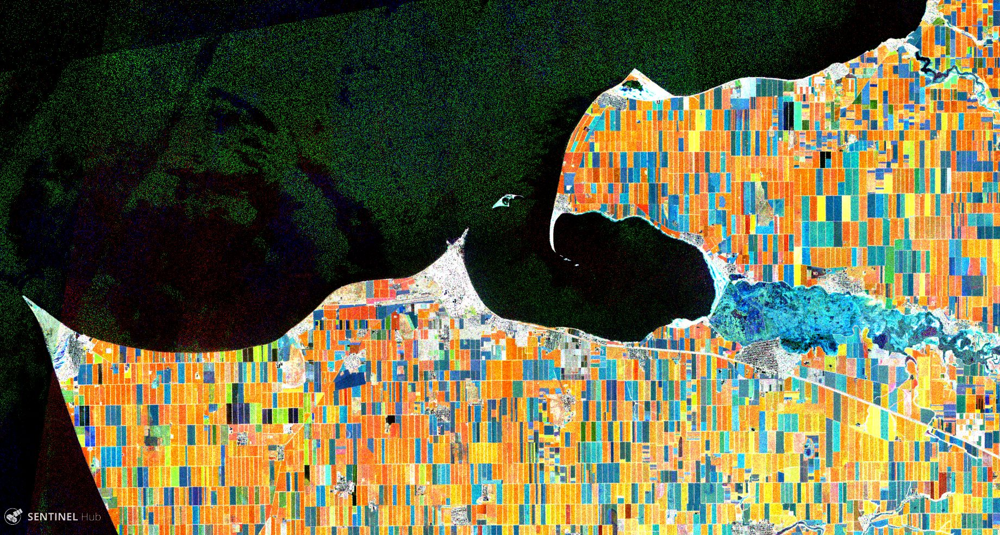

In the image you can see agriculture fields around Yeya river, Krasnodar region, Russia.

**Install all the necessary Python packages to run this application code**

In [ ]:
!pip install geemap
!pip install earthengine-api
!pip install --upgrade mogptk
!pip install PyCRS
!pip install vam.whittaker
!pip install cython
!pip install modape==1.0.3
!pip install pygal
!pip install ipygee
!pip install mss

**Import Python packages**

In [ ]:
import ee
import geemap
import geemap.colormaps as cm

import pygal
import ipygee as ui
from ipygee import *
from ipygee import chart

import geemap.chart as chart

import mogptk
import  pycrs
from ipyleaflet import *
from ipywidgets import Label

from datetime import datetime, timedelta
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sys
import time

import matplotlib.dates as mdates
from scipy.io import loadmat, savemat
from scipy.interpolate import Akima1DInterpolator
from scipy import signal
from sklearn import preprocessing
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import normalize
import matplotlib.ticker as ticker

import vam.whittaker
from vam.whittaker import  ws2d, ws2dp, ws2doptv, lag1corr
import pandas as pd

import math
from shapely.geometry import box
import time

import scipy.io
import os
import pickle

import array
import modape
from modape.whittaker import ws2d, ws2doptv, ws2doptvp
from modape.utils import DateHelper, fromjulian

import cv2
from PIL import Image, ImageFilter
from scipy.stats import gaussian_kde

**Mount Google Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

**Clone the GitHub repository**

In [ ]:
!rm -r ESA-summer-school-2023-Croatia # delete the complete repository folder
!git clone https://github.com/PhD-Gabriel-Caballero/ESA-summer-school-2023-Croatia # clone repository folder
sys.path.insert(0,'/content/ESA-summer-school-2023-Croatia')

Cloning into 'ESA-summer-school-2023-Croatia'...
remote: Enumerating objects: 257, done.
remote: Counting objects: 100% (204/204), done.
remote: Compressing objects: 100% (122/122), done.
remote: Total 257 (delta 158), reused 116 (delta 80), pack-reused 53
Receiving objects: 100% (257/257), 29.21 MiB | 10.16 MiB/s, done.
Resolving deltas: 100% (169/169), done.


**To use the Earth Engine API on the GEE cloud platform, import ee and geemap, and then log in to authenticate**

In [ ]:
try:
    ee.Initialize()
except Exception as e:
    ee.Authenticate()
    ee.Initialize()

**Define and visualize the study area**

In [ ]:
# Set map display properties.
Map = geemap.Map(toolbar_ctrl=True, layer_ctrl=True)
Map.default_style = {'cursor': 'crosshair'}
Map.add_basemap('SATELLITE')

# Center the map in the desired country
country = 'Argentina'
country_bounds = ee.FeatureCollection("USDOS/LSIB_SIMPLE/2017").filterMetadata('country_na', 'equals', country);
Map.centerObject(country_bounds,6)
Map

Map(center=[-34.687845828472675, -64.74963675588427], controls=(WidgetControl(options=['position', 'transparen…

**Show the Region Of Interest (ROI) in the interactive map**

In [ ]:
# Please provide here the information on the experimental station and the boundaries of your crop essay.
wheat_roi = geemap.shp_to_ee('/content/ESA-summer-school-2023-Croatia/Vectors/Wheat trial sketch 2020/wheat trial sketch 2020.shp')
EEHA_roi = geemap.shp_to_ee('/content/ESA-summer-school-2023-Croatia/Vectors/EEHA boundaries/INTA EEHA subdivision 2020.shp')
wheat_insitu_points =  geemap.shp_to_ee('/content/ESA-summer-school-2023-Croatia/Vectors/Wheat sampling points 2020/wheat_sampling_points_2020.shp')
wheat_insitu_points_insitu_data_2020 = geemap.shp_to_ee('/content/ESA-summer-school-2023-Croatia/Vectors/Wheat sampling points 2020/wheat_sampling_points_insitu_data_2020.shp')

Map.addLayer(wheat_roi, {},'Wheat roi 2020',True, opacity = 0.3)
Map.addLayer(wheat_insitu_points, {},'Wheat insitu points 2020',True)
Map.addLayer(EEHA_roi, {},'Study area',True, opacity = 0.5)

**Retrieve the ROI from the map**

In [ ]:
feature = Map.draw_last_feature
analized_roi = feature.geometry(proj="EPSG:4326")

### **Part-1: Sentinel-2 MSI data processing**

**Functions definition**

In [ ]:
# Function to calculate and add a parametric index band (EVI)

# Original definition of EVI index:
#EVI = 2.5 * ((NIR - RED) / (NIR + 6 * RED - 7.5 * BLUE + 1))

# Sentinel-1 bands:
#NIR = B8 (842nm)
#RED = B4 (665 nm)
#BLUE = B2 (490 nm)

# ARTMO-based EVI formulation for S2 spectral configuration:
# EVI [2.5.*((B2*-B3*)./(B2*+(6.*B3*)-7.5.*(B1*)+1))]

# Bands:
# B1*=560 nm
# B2*=740 nm
# B3*=783 nm

# (*) indicates the ordinal number of the spectral bands used in ARTMO.

def addEVI(image):
    # Compute the EVI parametric index.
    EVI = image.expression(
        '2.5 * ((band2 - band3) / (band2 + 6 * band3 - 7.5 * band1 + 1))', {
            'band1': image.select('B3'),
            'band2': image.select('B6'),
            'band3': image.select('B7')
        }).rename("EVI")

    image = image.addBands(EVI)

    return(image)

LAI linear regression in ARTMO based on EVI spectral index and wheat in situ data

NRME = 13.7537 %; R2=0.8525

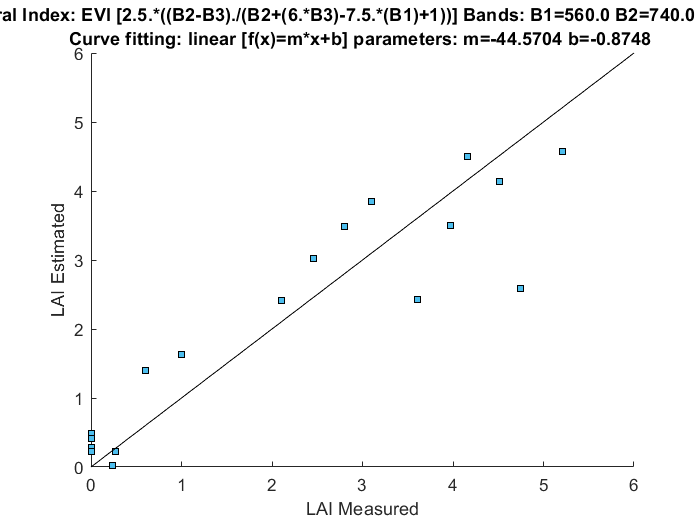

In [ ]:
# Function to calculate and add a parametric index band (LAI)

# The curve fitting was obtained through ARTMO: linear [f(x)=m*x+b] parameters: m=33.5111 b=-0.8891
# LAI = -44.5704*EVI - 0.8748

def addLAI(image):
    LAI = image.expression(
        '(-44.5704*EVI - 0.8748)', {
            'EVI': image.select('EVI')
        }).rename("LAI")
    image = image.addBands(LAI)

    return(image)

In [ ]:
# Clipping image collection by geometry
def clipcol(image):
    clipimage = image.clip(EEHA_roi)
    return clipimage

In [ ]:
# Masking function for water and cloud filtering

def maskS2cloud_and_water(image):
  not_water = image.select('SCL').neq(6);
  not_cloud_low = image.select('SCL').neq(7);
  not_cloud_medium = image.select('SCL').neq(8);
  not_cloud_high = image.select('SCL').neq(9);
  not_cirrus = image.select('SCL').neq(10);

  # Bits 10 and 11 are clouds and cirrus, respectively.
  qa = image.select('QA60');
  cloudBitMask = 1 << 10;
  cirrusBitMask = 1 << 11;

  # Both flags should be set to zero, indicating clear conditions.
  mask = (qa.bitwiseAnd(cloudBitMask).eq(0).And(qa.bitwiseAnd(cirrusBitMask).eq(0)).And(not_water).And(not_cloud_low)
          .And(not_cloud_medium).And(not_cloud_high).And(not_cirrus))
  return image.updateMask(mask).divide(10000).copyProperties(qa).set('system:time_start', qa.get('system:time_start'))



---

Bitmask for QA60

Bits 0-9: Unused

Bit 10: Opaque clouds
  0: No opaque clouds
  1: Opaque clouds present
  
Bit 11: Cirrus clouds
  0: No cirrus clouds
  1: Cirrus clouds present

---

SLC Scene Classification Map band
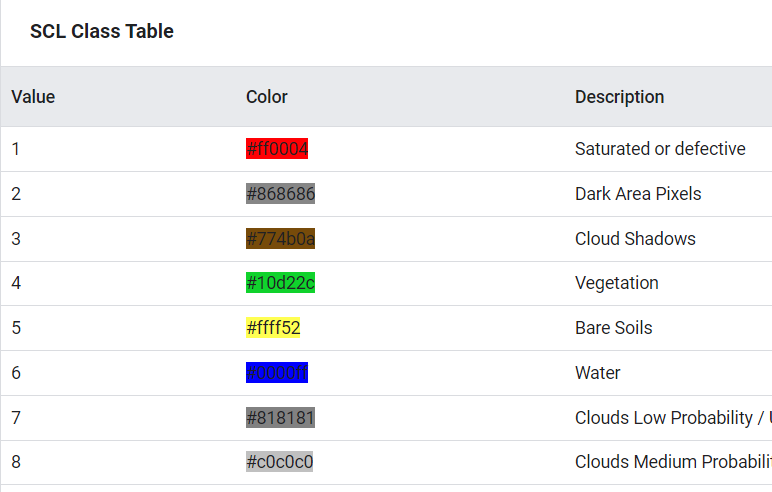
---

To get a complete understanding of the Q60 cloud mask and the SCL Scene Classification Map bands, kindly refer to the link provided below:

[Q60 Cloud mask](https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S2_SR#bands)

---

If you're looking for a more intricate method for obtaining cloud and shadow-free images in GEE, check out the tutorial available through the following link:

[Sentinel-2 Cloud Masking with s2cloudless](https://developers.google.com/earth-engine/tutorials/community/sentinel-2-s2cloudless)

This tutorial is an introduction to masking clouds and cloud shadows in Sentinel-2 (S2) surface reflectance (SR) data using Earth Engine. Clouds are identified from the S2 cloud probability dataset (s2cloudless) and shadows are defined by cloud projection intersection with low-reflectance near-infrared (NIR) pixels.

---


**Dates of interest and acquisitions configuration parameters**

In [ ]:
# Configuration Parameters
start_date = '2018-12-01'
end_date = '2021-01-11'
S2_CPP = 5 # CLOUDY_PIXEL_PERCENTAGE
roi = analized_roi # Select the current region of interest

**Create the initial image collection with the spectral bands**

In [ ]:
# Retrieving Sentinel 2 imagery
print('SENTINEL-2 time series being retrieved')
S2collection_raw = ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')\
                   .filterBounds(roi)\
                   .filterDate(start_date,end_date)\
                   .filterMetadata('CLOUDY_PIXEL_PERCENTAGE','less_than', S2_CPP)\
                   .map(maskS2cloud_and_water)\
                   .select(['B2', 'B3', 'B4', 'B5', 'B6', 'B7','B8','B8A','B11','B12'])\

# Apply water masking functions to the image collection
S2collection_ini = S2collection_raw.map(addEVI).map(clipcol).select(['B2', 'B3', 'B4','EVI']);

SENTINEL-2 time series being retrieved


**Sentinel 2 date label extraction**

In [ ]:
# Creating labels - Multitemporal plotting
labels_S2 = S2collection_ini.aggregate_array("system:index").getInfo()

# Dates S2
Dates_S2 = []
for i in labels_S2:
    Dates_S2.append(datetime.strptime(i.split('_')[0].split('T')[0], '%Y%m%d').date())
Dates_S2.sort()

#datetime.datetime.strptime(date, "%Y-%m-%d")
#https://stackoverflow.com/questions/19480028/attributeerror-datetime-module-has-no-attribute-strptime

**Generate a collection of retrieved images by using parametric indices**

In [ ]:
# Add the LAI band to the image collection
S2_PI_LAI_collection = S2collection_ini.map(addLAI).select('LAI')

**S2 image collection to a numpy array conversion**

In [ ]:
S2_PI_LAI_image = S2_PI_LAI_collection.toBands().unmask(0);
S2_PI_LAI_image_nparray = geemap.ee_to_numpy(ee_object = S2_PI_LAI_image.toArray(), region=analized_roi, default_value=None)

print('S2 ROI Dimension')
print(S2_PI_LAI_image_nparray.shape)

S2 ROI Dimension
(6, 6, 43)


**LAI mean calculation at ROI level**

In [ ]:
S2_PI_LAI_parcel_mean = S2_PI_LAI_image_nparray.mean(axis=1).mean(axis=0)
S2_PI_LAI_parcel_std = np.std(S2_PI_LAI_parcel_mean, axis=0)

**Plot S2-based LAI time series for the selected ROI**

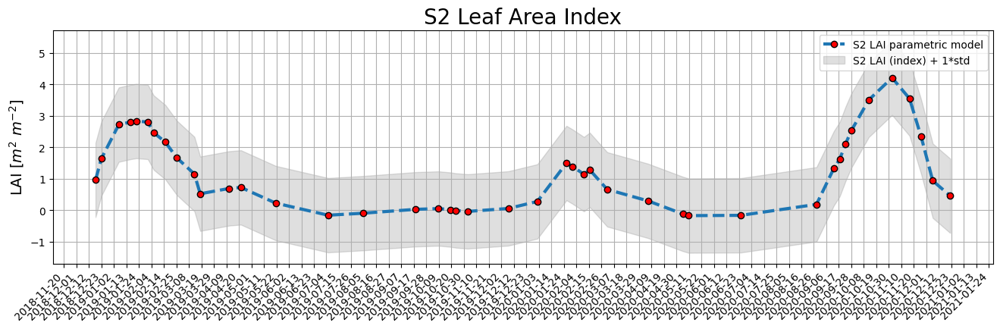

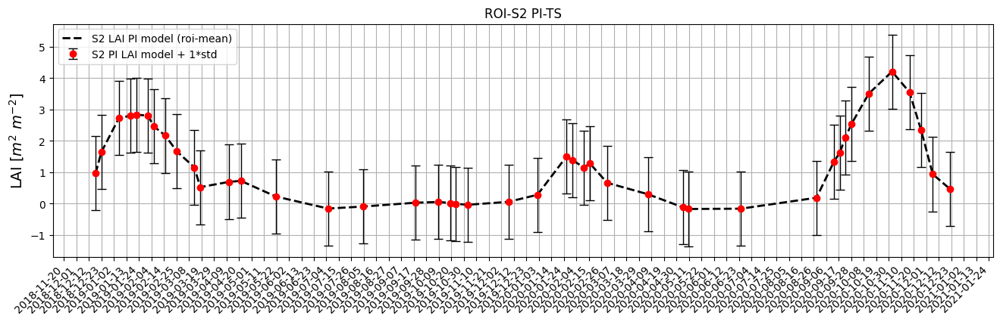

Temporal Series Length 43


In [ ]:
# Sentinel 2 LAI parametric index model time series plotting

axmaxloc = S2_PI_LAI_image_nparray.shape[2]/4;
axminloc = S2_PI_LAI_image_nparray.shape[2]/4;

#-------------------------------
# S2 LAI graph 1 (Shadowed standard deviation)

plt.figure(figsize= (16,4))
ax = plt.axes()
ax.xaxis.set_major_locator(ticker.MultipleLocator(axmaxloc))
ax.xaxis.set_minor_locator(ticker.MultipleLocator(axminloc))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

plt.plot(Dates_S2,S2_PI_LAI_parcel_mean,linestyle="--",marker="o",markerfacecolor='red',markeredgecolor='k',markersize=6,lw=3,label='S2 LAI parametric model')
plt.fill_between(Dates_S2, S2_PI_LAI_parcel_mean-S2_PI_LAI_parcel_std,S2_PI_LAI_parcel_mean+S2_PI_LAI_parcel_std ,alpha=0.25,color='grey',label='S2 LAI (index) + 1*std')
plt.title('S2 Leaf Area Index',fontsize='20')
plt.legend()
plt.grid(1)
plt.ylabel('LAI [$m^2$ $m^{-2}$]',fontsize='14')
plt.grid(1)
plt.xticks(rotation=45, ha='right')
plt.show()

#-------------------------------
#S2 LAI graph 2 (Error bars.)

plt.figure(figsize= (16,4))
ax = plt.axes()
ax.xaxis.set_major_locator(ticker.MultipleLocator(axmaxloc))
ax.xaxis.set_minor_locator(ticker.MultipleLocator(axminloc))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.plot(Dates_S2,S2_PI_LAI_parcel_mean,'--k', lw=2)
plt.errorbar(Dates_S2,S2_PI_LAI_parcel_mean, fmt='ro', label="data",yerr=S2_PI_LAI_parcel_std, ecolor='black', lw=1,capsize=4)
plt.title('ROI-S2 PI-TS')
plt.legend(['S2 LAI PI model (roi-mean)','S2 PI LAI model + 1*std'])
plt.grid(1)
plt.ylabel('LAI [$m^2$ $m^{-2}$]',fontsize='14')
plt.xticks(rotation=45, ha='right')
plt.show()

#-------------------------------
print('Temporal Series Length', S2_PI_LAI_parcel_mean.shape[0])

**S2 LAI image collection resampling at 10 m of spatial resolution**

In [ ]:
S2_PI_LAI_image_20m = S2_PI_LAI_collection.toBands();

proj = S2_PI_LAI_image_20m.projection().getInfo()
crs = proj['crs']

S2_PI_LAI_image_10m = S2_PI_LAI_image_20m.resample('bicubic').reproject(crs=crs, scale=10)

S2_PI_LAI_image_10m_nparray = geemap.ee_to_numpy(ee_object = S2_PI_LAI_image_10m.unmask(0).toArray(), region=analized_roi, default_value=None)

print('S2 ROI Dimension 10m')
print(S2_PI_LAI_image_10m_nparray.shape)

S2 ROI Dimension 10m
(10, 10, 43)


**Guide on establishing colour schemes for plotting interactive maps**

In [ ]:
# Thematic colour palette definition for LAI mapping

palette = [
    'FFFFFF', 'CE7E45', 'DF923D', 'F1B555', 'FCD163', '99B718',
    '74A901', '66A000', '529400', '3E8601', '207401', '056201',
    '004C00', '023B01', '012E01', '011D01', '011301']

LAI_palette  = {"min":0.5, "max":3.5, 'palette':palette}

# Map display parameters definition (RGB S2 image)
# Define visualization parameters for image
visParams = {
  'bands': ['B4', 'B3', 'B2'],
  'min': 0,
  'max': 0.2,
}
#cm.list_colormaps()

**Define an interactive map**

In [ ]:
map_center_lat = -39.400633
map_center_lon = -62.639496

Map_S2_LAI = geemap.Map()
Map_S2_LAI = geemap.Map(center=(map_center_lat,map_center_lon), zoom=14)
Map_S2_LAI.set_plot_options(add_marker_cluster=True)
Map_S2_LAI

Map(center=[-39.400633, -62.639496], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HB…

**S2 LAI map plotting**

In [ ]:
image_number = 26 # select the ordinal number of the image you want to be displayed

# Converting the S2 image collection to an image list for RGB scene display
S2collection_list = S2collection_raw.toList(S2collection_raw.size());
S2image = ee.Image(S2collection_list.get(image_number));

# S2 RGB image display

Map_S2_LAI.addLayer(S2image,visParams,'S2 RGB composite',True)

# Single LAI map display

Map_S2_LAI.addLayer(S2_PI_LAI_image_10m.select(image_number), LAI_palette, 'S2 PI LAI image 10m')
Map_S2_LAI.addLayer(S2_PI_LAI_image_20m.select(image_number), LAI_palette, 'S2 PI LAI image 20m')

# On-screen display of color bars

Map_S2_LAI.add_colorbar(LAI_palette, label="LAI ($m^2$ $m^{-2}$)", orientation="horizontal", layer_name="LAI color bar")

# On-screen display of vector shapefile

Map_S2_LAI.addLayer(EEHA_roi, {},'Study area',True, opacity = 0.3)

### **Part-2: Sentinel-1 SAR data processing**

**Sentinel 1 imagery retrieval and RVI time series calculations**

In [ ]:
# Function to calculate and add an RVI band
# RVI = (4*VH)/(VV+VH)

def addRVI(image):
    rvi = (image.select('VH').divide(image.select('VH').add(image.select('VV'))).multiply(4)).rename('RVI');
    return image.addBands(rvi)

In [ ]:
#Function to convert from dB
def toNatural(img):
    return ee.Image(10.0).pow(img.select(0).divide(10.0))

#Function to convert to dB
def todB(img):
    return ee.Image(img).log10().multiply(10.0)

**Create the initial image collection with the polarimetric SAR bands**

In [ ]:
# Retrieving Sentinel 1 imagery
print('SENTINEL1 time series being retrieved')
S1collection = ee.ImageCollection('COPERNICUS/S1_GRD_FLOAT')\
                     .filterBounds(roi)\
                     .filterDate(start_date, end_date)\
                     .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VV'))\
                     .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VH'))\
                     .filter(ee.Filter.eq('instrumentMode', 'IW'))\
                     .filter(ee.Filter.eq('orbitProperties_pass', 'DESCENDING'))\
                     .filter(ee.Filter.eq('resolution','H'))\
                     .select('VH','VV')\

# Sort the dataset S1
S1collection = S1collection.sort('GRD_Post_Processing_start');

SENTINEL1 time series being retrieved


In [ ]:
# Speckle filtering
S1collection_VH  = ee.ImageCollection(S1collection.select(["VH"])).map(todB)
S1collection_VV  = ee.ImageCollection(S1collection.select(["VV"])).map(todB)

image_S1_VH = S1collection_VH.toBands();
image_S1_VV = S1collection_VV.toBands();

**Generate histogram with default number of bins**
[Chart histogram geemap](https://geemap.org/notebooks/79_chart_histogram/)

In [ ]:
# Set the data and plot options

source = image_S1_VV.select(image_number)
my_sample = source.sample(roi, 10)

property = source.bandNames().getInfo()[0] # Get image metadata

options = {
    "title": 'S1 backscatter histogram',
    "xlabel": 'S1 SAR backscatter',
    "ylabel": 'Pixel count',
    "colors": ['black'],
}

chart.feature_histogram(my_sample, property,minBucketWidth=0.5,**options)

In [ ]:
vis_VH = cm.get_palette('gray', n_class=10)
vis_VH = {'min': -30, 'max': -15, 'palette': vis_VH}

vis_VV = cm.get_palette('gray', n_class=10)
vis_VV = {'min': -17, 'max': -8, 'palette': vis_VV}

In [ ]:
map_center_lat = -39.400633
map_center_lon = -62.639496

Map_S1_pol = geemap.Map()
Map_S1_pol = geemap.Map(center=(map_center_lat,map_center_lon), zoom=12)
Map_S1_pol.set_plot_options(add_marker_cluster=True)
Map_S1_pol

Map(center=[-39.400633, -62.639496], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HB…

**S1 VH & VV polarimetric bands map display**

In [ ]:
# Single image display

Map_S1_pol.addLayer(image_S1_VH.select(image_number), vis_VH, 'S1 VH image')
Map_S1_pol.addLayer(image_S1_VV.select(image_number), vis_VV, 'S1 VV image')

# Image collection display (mean, max or min).

Map_S1_pol.addLayer(S1collection_VH.mean(),vis_VH, 'S1 VH collection mean')
Map_S1_pol.addLayer(S1collection_VV.mean(),vis_VV, 'S1 VV collection mean')

# On-screen display of color bars

Map_S1_pol.add_colorbar(vis_VH, label="VH", orientation="horizontal", layer_name="VH color bar")
Map_S1_pol.add_colorbar(vis_VV, label="VV", orientation="horizontal", layer_name="VV color bar")

# On-screen display of vector shapefile

Map_S1_pol.addLayer(EEHA_roi, {},'Study area',True, opacity = 0.3)

**S1 collection filtering**

In [ ]:
S1_collection_P141 =  S1collection.filter(ee.Filter.eq('relativeOrbitNumber_start',141)).map(clipcol)
S1_collection_P68  =  S1collection.filter(ee.Filter.eq('relativeOrbitNumber_start',68)).map(clipcol)

**S1 RVI Calculations**

In [ ]:
S1_RVI_collection_P141 = S1_collection_P141.map(addRVI).select('RVI')
S1_RVI_collection_P68 = S1_collection_P68.map(addRVI).select('RVI')

**S1 dates extraction**

In [ ]:
# Creating labels - Multitemporal plotting (filtered dataset)

labels_S1_P141 = S1_RVI_collection_P141.aggregate_array("system:index").getInfo()
labels_S1_P68  = S1_RVI_collection_P68.aggregate_array("system:index").getInfo()

# Dates S1 filtered (S1A - Path 141)
Dates_S1_P141 = []
for i in labels_S1_P141:
    Dates_S1_P141.append(datetime.strptime(i.split('_')[4].split('T')[0], '%Y%m%d').date())
Dates_S1_P141.sort()

# Dates S1 filtered (Path 68)
Dates_S1_P68 = []
for i in labels_S1_P68:
    Dates_S1_P68.append(datetime.strptime(i.split('_')[4].split('T')[0], '%Y%m%d').date())
Dates_S1_P68.sort()

**S1 image collection to a numpy array conversion**

In [ ]:
# Convert S1 image collection to a numpy array (S1A - Path 141)
S1_RVI_image_P141 = S1_RVI_collection_P141.toBands();
S1_RVI_image_P141_nparray = geemap.ee_to_numpy(ee_object = S1_RVI_image_P141.toArray(), region=roi, default_value=None)
print('S1 - Path 141 ROI Dimension')
print(S1_RVI_image_P141_nparray.shape)

# Convert S1 image collection to a numpy array (Path 68)
S1_RVI_image_P68 = S1_RVI_collection_P68.toBands();
S1_RVI_image_P68_nparray = geemap.ee_to_numpy(ee_object = S1_RVI_image_P68.toArray(), region=roi, default_value=None)
print('S1 - Path 68 ROI Dimension')
print(S1_RVI_image_P68_nparray.shape)

S1 - Path 141 ROI Dimension
(11, 10, 62)
S1 - Path 68 ROI Dimension
(10, 11, 99)


**S1 RVI mean calculation at ROI level**

In [ ]:
S1_RVI_image_P141_nparray_mean = S1_RVI_image_P141_nparray.mean(axis=1).mean(axis=0)
S1_RVI_image_P141_nparray_std = np.std(S1_RVI_image_P141_nparray_mean, axis = 0)

S1_RVI_image_P68_nparray_mean = S1_RVI_image_P68_nparray.mean(axis=1).mean(axis=0)
S1_RVI_image_P68_nparray_std = np.std(S1_RVI_image_P68_nparray_mean, axis = 0)

**S1 time-series plotting**

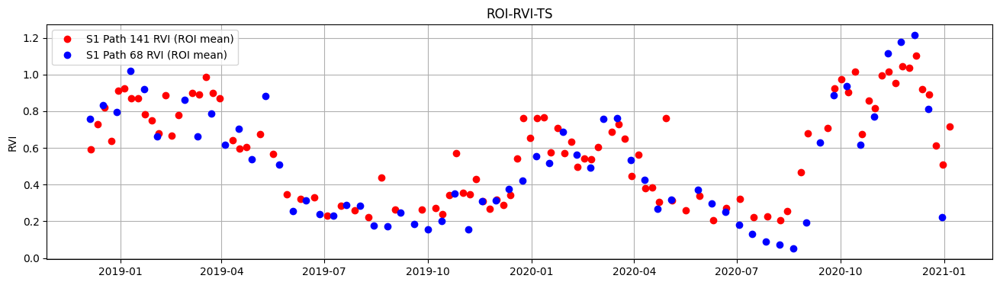

In [ ]:
plt.figure(figsize= (16,4))

plt.plot(Dates_S1_P68,S1_RVI_image_P68_nparray_mean,'ro',lw=4)
plt.plot(Dates_S1_P141,S1_RVI_image_P141_nparray_mean,'bo',lw=4)

plt.title('ROI-RVI-TS')
plt.legend(['S1 Path 141 RVI (ROI mean)','S1 Path 68 RVI (ROI mean)'])
plt.ylabel("RVI")
plt.grid(1)
plt.show()

Sentinel-1 Path 68 RVI time series


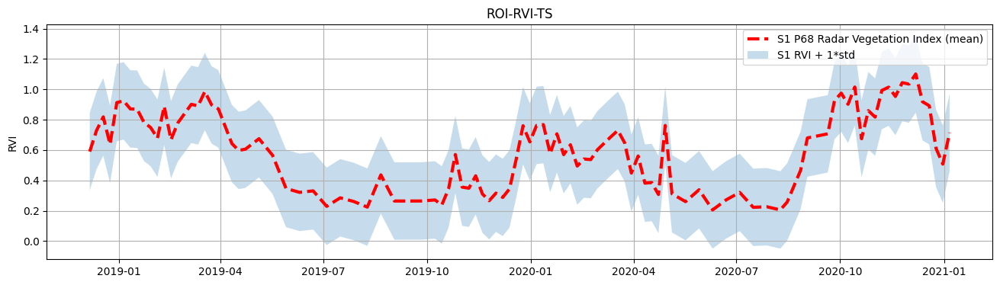

Sentinel-1 Path 141 RVI time series


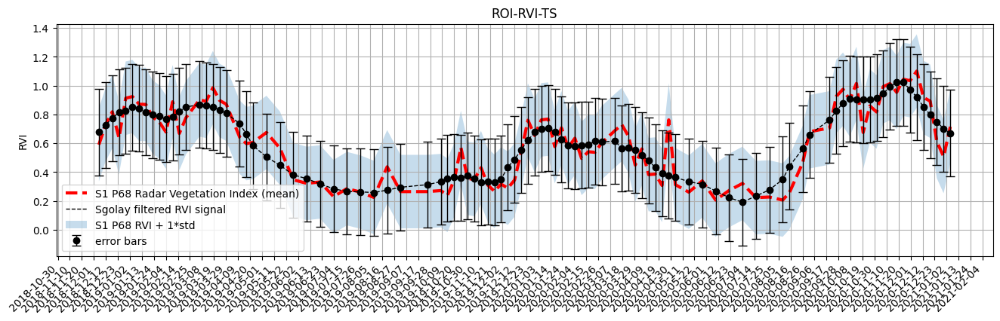

In [ ]:
#------------------------------
print('Sentinel-1 Path 68 RVI time series')

plt.figure(figsize= (16,4))
plt.plot(Dates_S1_P68,S1_RVI_image_P68_nparray_mean,'r--',lw=3)
plt.fill_between(Dates_S1_P68,S1_RVI_image_P68_nparray_mean-S1_RVI_image_P68_nparray_std,S1_RVI_image_P68_nparray_mean+S1_RVI_image_P68_nparray_std ,alpha=0.25)
plt.title('ROI-RVI-TS')
plt.legend(['S1 P68 Radar Vegetation Index (mean)','S1 RVI + 1*std'])
plt.grid(1)
plt.ylabel("RVI")
plt.show()

#------------------------------
print('Sentinel-1 Path 141 RVI time series')

S1_RVI_P68_smooth = signal.savgol_filter(S1_RVI_image_P68_nparray_mean, window_length=14, polyorder=2, mode="nearest")

plt.figure(figsize= (16,4))

ax = plt.axes()
ax.xaxis.set_major_locator(ticker.MultipleLocator(axmaxloc))
ax.xaxis.set_minor_locator(ticker.MultipleLocator(axminloc))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

plt.plot(Dates_S1_P68,S1_RVI_image_P68_nparray_mean,'r--',lw=3)
plt.plot(Dates_S1_P68,S1_RVI_P68_smooth,'k--',lw=1)
plt.errorbar(Dates_S1_P68, S1_RVI_P68_smooth, fmt='ko', label="data", yerr=S1_RVI_image_P141_nparray_std, ecolor='black', lw=1,capsize=4)
plt.fill_between(Dates_S1_P68,S1_RVI_image_P68_nparray_mean-S1_RVI_image_P68_nparray_std,S1_RVI_image_P68_nparray_mean+S1_RVI_image_P68_nparray_std ,alpha=0.25)
plt.title('ROI-RVI-TS')
plt.legend(['S1 P68 Radar Vegetation Index (mean)','Sgolay filtered RVI signal','S1 P68 RVI + 1*std','error bars'])
plt.grid(1)
plt.xticks(rotation=45, ha='right')
plt.ylabel("RVI")
plt.show()

Sentinel-1 Path 68 RVI time series


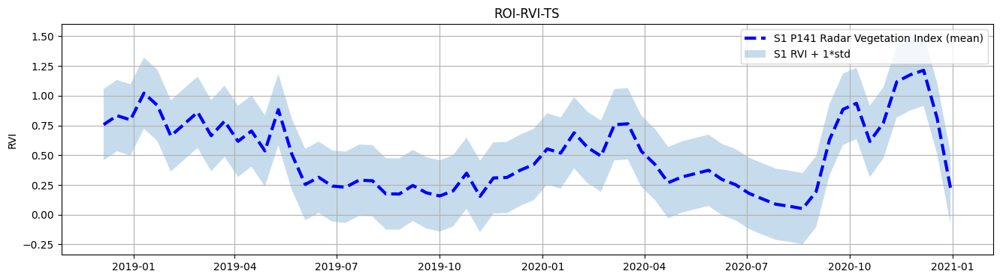

Sentinel-1 Path 141 RVI time series


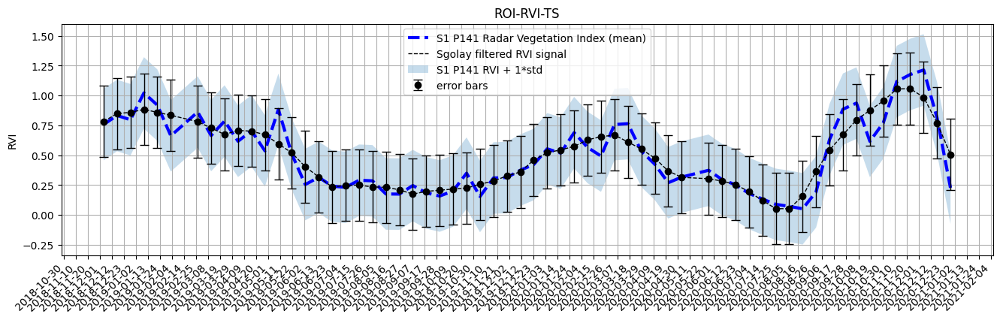

In [ ]:
#------------------------------
print('Sentinel-1 Path 68 RVI time series')

plt.figure(figsize= (16,4))
plt.plot(Dates_S1_P141,S1_RVI_image_P141_nparray_mean,'b--',lw=3)
plt.fill_between(Dates_S1_P141,S1_RVI_image_P141_nparray_mean-S1_RVI_image_P141_nparray_std,S1_RVI_image_P141_nparray_mean+S1_RVI_image_P141_nparray_std ,alpha=0.25)
plt.title('ROI-RVI-TS')
plt.legend(['S1 P141 Radar Vegetation Index (mean)','S1 RVI + 1*std'])
plt.grid(1)
plt.ylabel("RVI")
plt.show()
#------------------------------
print('Sentinel-1 Path 141 RVI time series')

S1_RVI_P141_smooth = signal.savgol_filter(S1_RVI_image_P141_nparray_mean, window_length=9, polyorder=2, mode="nearest")

plt.figure(figsize= (16,4))

ax = plt.axes()
ax.xaxis.set_major_locator(ticker.MultipleLocator(axmaxloc))
ax.xaxis.set_minor_locator(ticker.MultipleLocator(axminloc))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

plt.plot(Dates_S1_P141,S1_RVI_image_P141_nparray_mean,'b--',lw=3)
plt.plot(Dates_S1_P141,S1_RVI_P141_smooth,'k--',lw=1)
plt.errorbar(Dates_S1_P141, S1_RVI_P141_smooth, fmt='ko', label="data", yerr=S1_RVI_image_P141_nparray_std, ecolor='black', lw=1,capsize=4)
plt.fill_between(Dates_S1_P141,S1_RVI_image_P141_nparray_mean-S1_RVI_image_P141_nparray_std,S1_RVI_image_P141_nparray_mean+S1_RVI_image_P141_nparray_std ,alpha=0.25)
plt.title('ROI-RVI-TS')
plt.legend(['S1 P141 Radar Vegetation Index (mean)','Sgolay filtered RVI signal','S1 P141 RVI + 1*std','error bars'])
plt.grid(1)
plt.xticks(rotation=45, ha='right')
plt.ylabel("RVI")
plt.show()

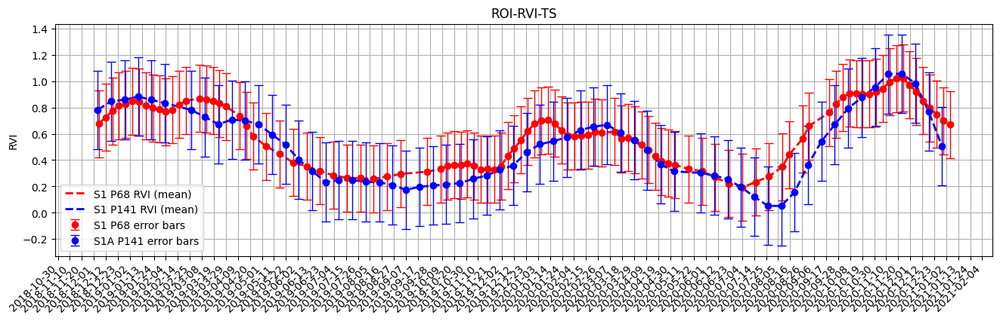

In [ ]:
#------------------------------
plt.figure(figsize= (16,4))

ax = plt.axes()
ax.xaxis.set_major_locator(ticker.MultipleLocator(axmaxloc))
ax.xaxis.set_minor_locator(ticker.MultipleLocator(axminloc))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

plt.plot(Dates_S1_P68,S1_RVI_P68_smooth,'r--',lw=2)
plt.errorbar(Dates_S1_P68, S1_RVI_P68_smooth, fmt='ro', label="data", yerr=S1_RVI_image_P68_nparray_std, ecolor='red', lw=1,capsize=4)
plt.plot(Dates_S1_P141,S1_RVI_P141_smooth,'b--',lw=2)
plt.errorbar(Dates_S1_P141,S1_RVI_P141_smooth, fmt='bo', label="data", yerr=S1_RVI_image_P141_nparray_std, ecolor='blue', lw=1,capsize=4)

plt.title('ROI-RVI-TS')
plt.legend(['S1 P68 RVI (mean)','S1 P141 RVI (mean)','S1 P68 error bars','S1A P141 error bars'])
plt.grid(1)
plt.ylabel("RVI")
plt.xticks(rotation=45, ha='right')
plt.show()

In [ ]:
vis_RVI = { 'min': 0,
  'max': 1,
  'palette': [
    '#FFFFFF','#CE7E45','#DF923D','#F1B555','#FCD163','#99B718', '#74A901','#66A000','#529400','#3E8601','#207401','#056201','#004C00','#023B01','#012E01','#011D01', '#011301'
    #'#31a354','#fee391','#fec44f','#fe9929','#d95f0e','#993404'
  ],}

In [ ]:
map_center_lat = -39.400633
map_center_lon = -62.639496

Map_S1_RVI = geemap.Map()
Map_S1_RVI = geemap.Map(center=(map_center_lat,map_center_lon), zoom=14)
Map_S1_RVI.set_plot_options(add_marker_cluster=True)
Map_S1_RVI

Map(center=[-39.400633, -62.639496], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HB…

**S1 RVI map display**

In [ ]:
# S1 VV Image collection display (mean, max or min).

Map_S1_RVI.addLayer(S1collection_VV.mean(),vis_VV, 'S1 VV collection mean')

# S1 RVI single image display

Map_S1_RVI.addLayer(S1_RVI_image_P141.select(image_number), vis_RVI, 'S1 RVI image')

# S1 RVI Image collection display (mean, max or min).

Map_S1_RVI.addLayer(S1_RVI_collection_P141.mean(),vis_RVI, 'S1 RVI collection mean')

# On-screen display of S1 RVI time sliders

Map_S1_RVI.add_time_slider(S1_RVI_collection_P141, vis_RVI, region=EEHA_roi,layer_name='S1 P141 RVI time-series',labels=labels_S1_P141)

# On-screen display of RVI colour bar

Map_S1_RVI.add_colorbar(vis_RVI, label="RVI", orientation="horizontal", layer_name="RVI color bar")

# On-screen display of vector shapefile

Map_S1_RVI.addLayer(EEHA_roi, {},'Study area',True, opacity = 0.3)

### **Part-3: MOGPTR algorithm selection for SAR and optical data fusion**

## Multi-Output Gaussian Process Toolkit

The Multi-Output Gaussian Process Toolkit is a Python toolkit for training and interpreting Gaussian process models with multiple data channels. It builds upon PyTorch to provide an easy way to train multi-output models effectively on CPUs and GPUs. The main authors are Taco de Wolff, Alejandro Cuevas, and Felipe Tobar as part of the Center for Mathematical Modelling at the University of Chile.


---
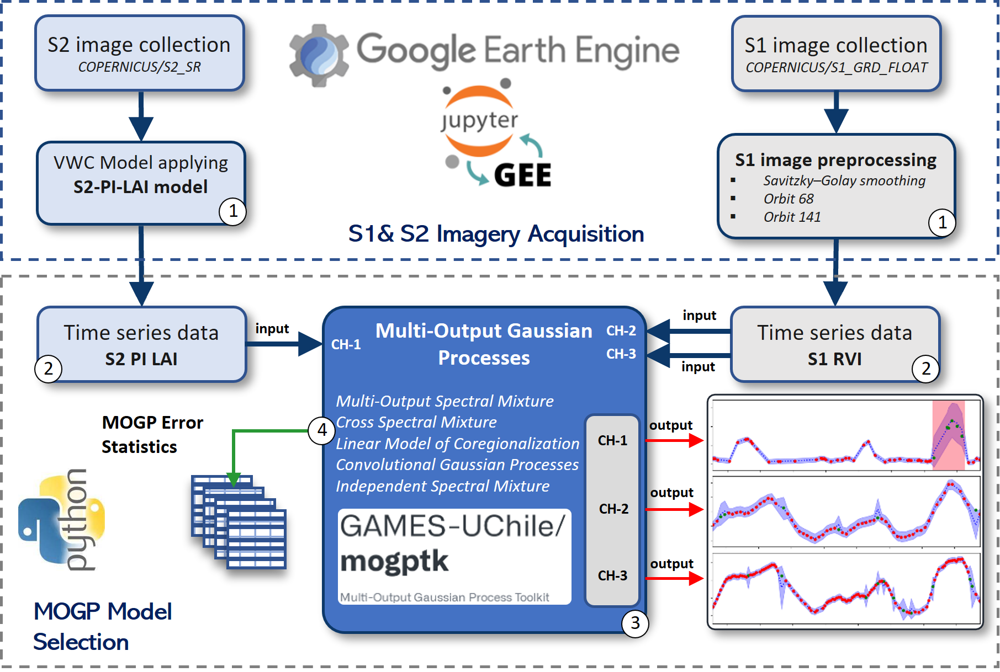

---

[Multi-Output Gaussian Process Toolkit](https://github.com/GAMES-UChile/mogptk)

**Functions definitions**

In [ ]:
class TransformStandard(mogptk.TransformBase):

    # Transform the data so it has mean 0 and variance 1

    def __init__(self):
        pass

    def set_data(self, y, x=None):
        self.mean = y.mean()
        self.std = y.std()

    def forward(self, y, x=None):
        return (y - self.mean) / self.std

    def backward(self, y, x=None):
        return (y * self.std) + self.mean

**Dataset generation**

In [ ]:
# From datetime to time-stamps (days since 1900/01/01)
baseDate = datetime(1900,1,1).date()

numericalDates_S2 = []
numericalDates_S1_P141 = []
numericalDates_S1_P68 = []

numericalDates_S2 = np.asarray([(d - baseDate).days for d in Dates_S2])
numericalDates_S1_P141 = np.asarray([(d - baseDate).days for d in Dates_S1_P141])
numericalDates_S1_P68 = np.asarray([(d - baseDate).days for d in Dates_S1_P68])

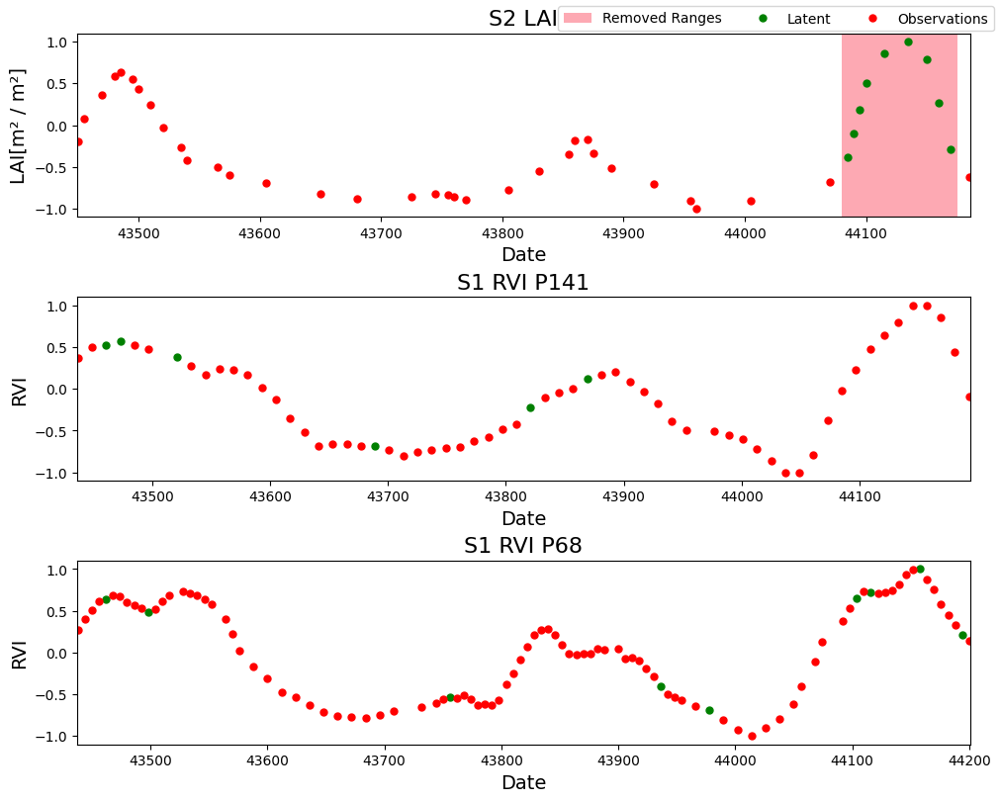

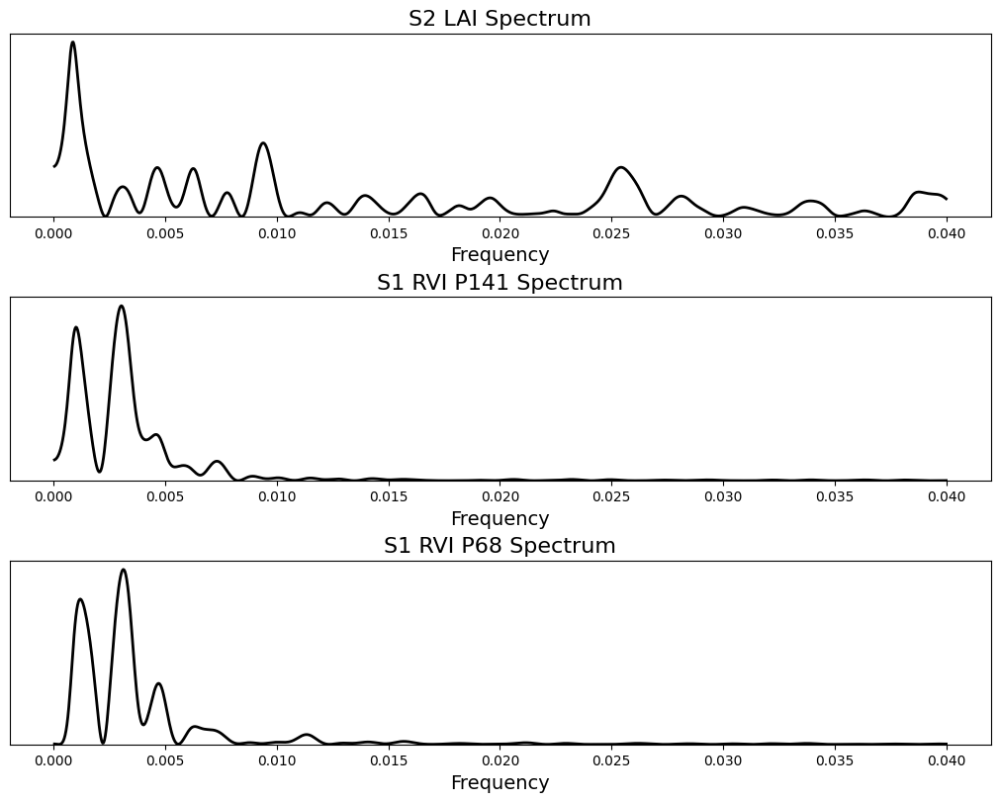

In [ ]:
## create dataset
np.random.seed(10)  # for reproducibility

filtering=1;
svg_param = 7;
svg_poly = 2;

if filtering==1:
  Y1 =  signal.savgol_filter(S2_PI_LAI_parcel_mean, window_length=svg_param, polyorder=svg_poly, mode="nearest")
  Y2 = S1_RVI_P141_smooth
  Y3 = S1_RVI_P68_smooth

if filtering==0:
  Y1 = S2_PI_LAI_parcel_mean
  Y2 = S1_RVI_image_P141_nparray_mean
  Y3 = S1_RVI_image_P68_nparray_mean


dataset_S1S2 = mogptk.DataSet(
      mogptk.Data(numericalDates_S2, Y1, x_labels='Date', y_label='LAI[m\N{SUPERSCRIPT TWO} / m\N{SUPERSCRIPT TWO}]', name='S2 LAI'),
      mogptk.Data(numericalDates_S1_P141, Y2, x_labels='Date', y_label='RVI', name='S1 RVI P141'),
      mogptk.Data(numericalDates_S1_P68, Y3, x_labels='Date', y_label='RVI', name='S1 RVI P68'),

)
dataset_S1S2[1].remove_randomly(pct=0.1)
dataset_S1S2[2].remove_randomly(pct=0.1)

dataset_S1S2.transform(mogptk.TransformDetrend(degree=1))
dataset_S1S2.transform(TransformStandard())
dataset_S1S2.transform(mogptk.TransformNormalize())

# Plot dataset

dataset_S1S2[0].remove_range(start=44080, end=44175)
dataset_S1S2.plot('Normalized data set', transformed=True,figsize=(10,8))
dataset_S1S2.plot_spectrum(maxfreq=0.04,figsize=(10,8))

nc = len(dataset_S1S2); #number of channels

In [ ]:
#valid methods of estimation are BNSE, LS, and SM
#optimizer must be LBFGS, Adam, SGD, or AdaGrad
Q = 4
init_method = 'SM'
method = 'Adam'
lr = 0.1
iters = 500
nc = len(dataset_S1S2); #number of channels

### **Multi-output spectral mixture kernel**

--- 33.73003005981445 seconds ---


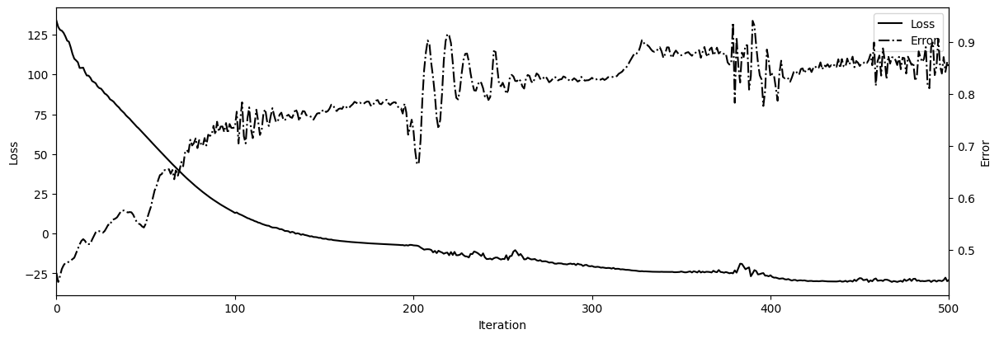

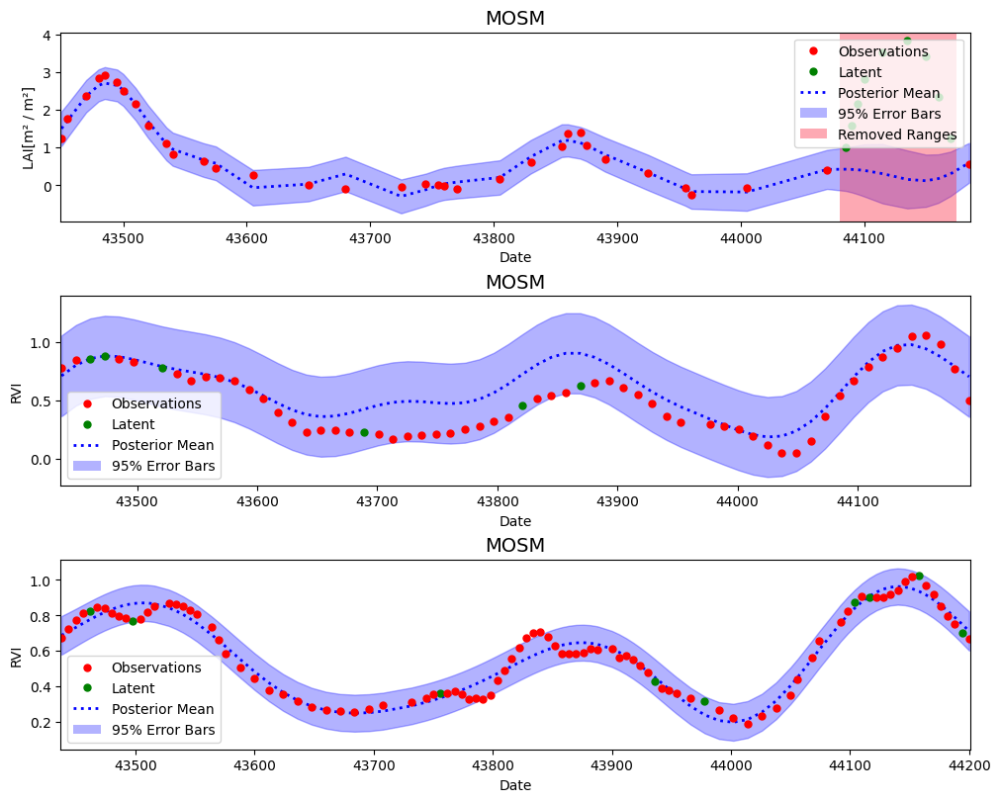

In [ ]:
mosm_dataset = dataset_S1S2.copy()

start_time = time.time()

mosm = mogptk.MOSM(mosm_dataset, Q=Q)
mosm.init_parameters(init_method)

mosm.train(method=method, lr=lr, iters=iters, verbose=False, error='MAE',plot=True)
mosm.plot_prediction(title='MOSM',figsize=(10,8));

print("--- %s seconds ---" % (time.time() - start_time))

In [ ]:
mosm_mae = np.zeros((1,nc))
mosm_rmse = np.zeros((1,nc))
mosm_mape = np.zeros((1,nc))

mosm_error = mogptk.error(mosm, per_channel=True)[0]
mosm_mae[:] = np.array([item['MAE'] for item in mosm_error])
mosm_rmse[:] = np.array([item['RMSE'] for item in mosm_error])
mosm_mape[:] = np.array([item['MAPE'] for item in mosm_error])

mogptk.error(mosm, disp=True, per_channel=True);
print('\n')

,MAE,MAPE,RMSE
Name,,,
MOSM channel 1,2.135293,83.335461,2.377588
MOSM channel 2,0.126289,31.569079,0.176999
MOSM channel 3,0.049593,8.359457,0.058050


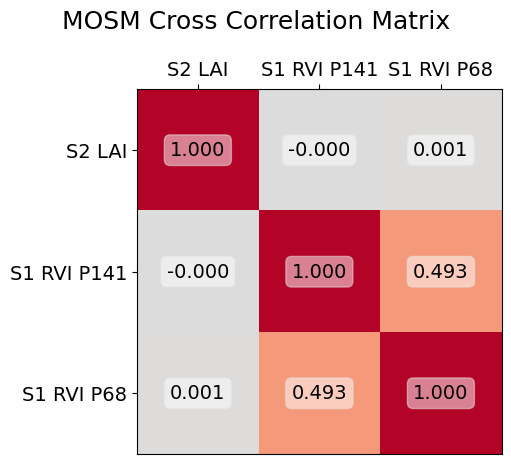

In [ ]:
mosm.plot_correlation(title='MOSM Cross Correlation Matrix',figsize=(5, 5));

### **Cross spectral mixture kernel**

--- 48.40400147438049 seconds ---


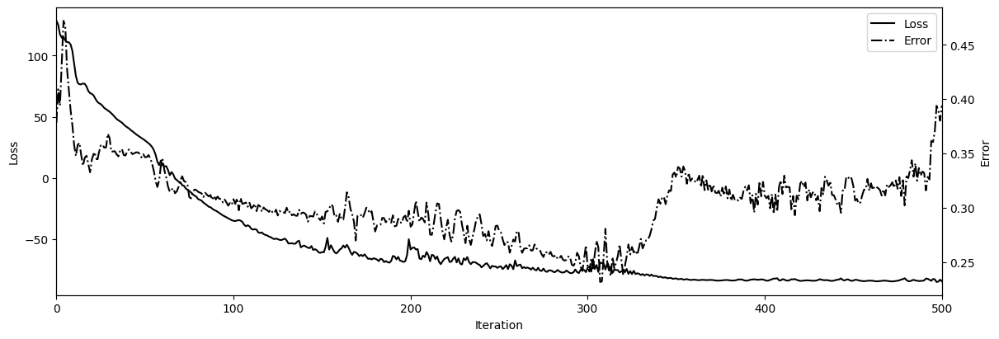

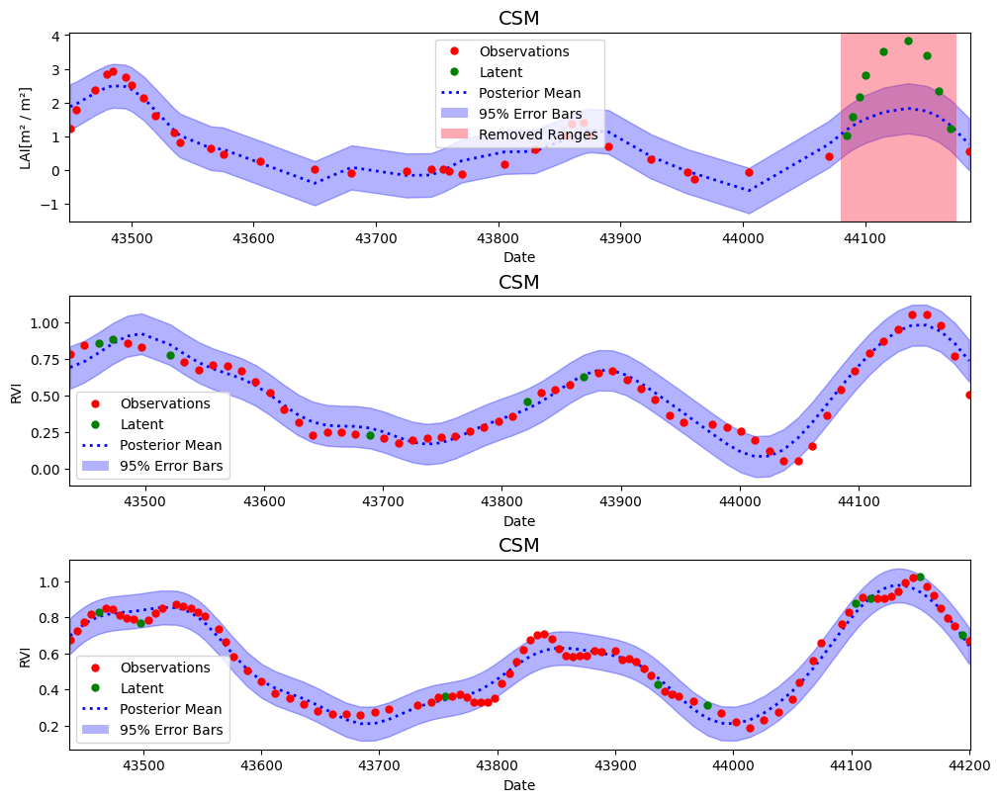

In [ ]:
csm_dataset = dataset_S1S2.copy()

start_time = time.time()

csm = mogptk.CSM(csm_dataset, Q=Q)
csm.init_parameters(init_method)

csm.train(method=method, lr=lr, iters=iters, verbose=False, error='MAE',plot=True)
csm.plot_prediction(title='CSM',figsize=(10,8));

print("--- %s seconds ---" % (time.time() - start_time))

In [ ]:
csm_mae = np.zeros((1,nc))
csm_rmse = np.zeros((1,nc))
csm_mape = np.zeros((1,nc))

csm_error = mogptk.error(csm, per_channel=True)[0]
csm_mae[:] = np.array([item['MAE'] for item in csm_error])
csm_rmse[:] = np.array([item['RMSE'] for item in csm_error])
csm_mape[:] = np.array([item['MAPE'] for item in csm_error])

mogptk.error(csm, disp=True, per_channel=True);

,MAE,MAPE,RMSE
Name,,,
CSM channel 1,0.980904,34.184813,1.201332
CSM channel 2,0.045434,8.843839,0.049560
CSM channel 3,0.039682,7.014485,0.048935


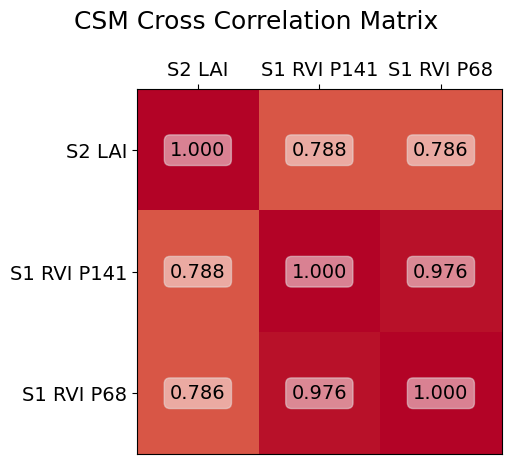

In [ ]:
csm.plot_correlation(title='CSM Cross Correlation Matrix',figsize=(5, 5));

### **Linear model of coregionalization with spectral mixture kernels**

--- 32.22755765914917 seconds ---


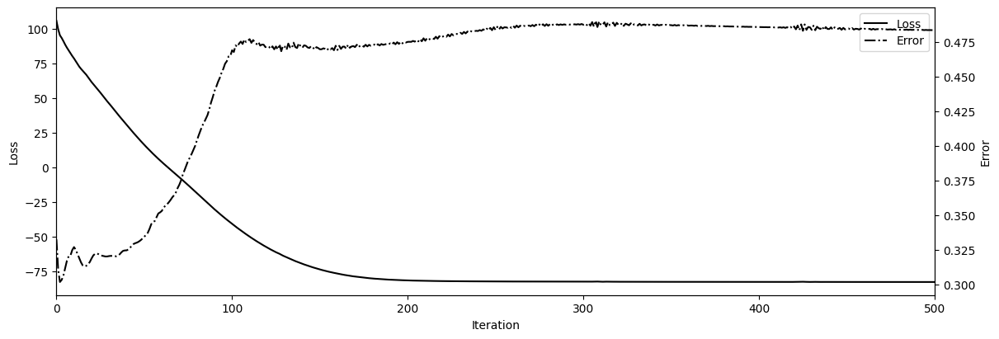

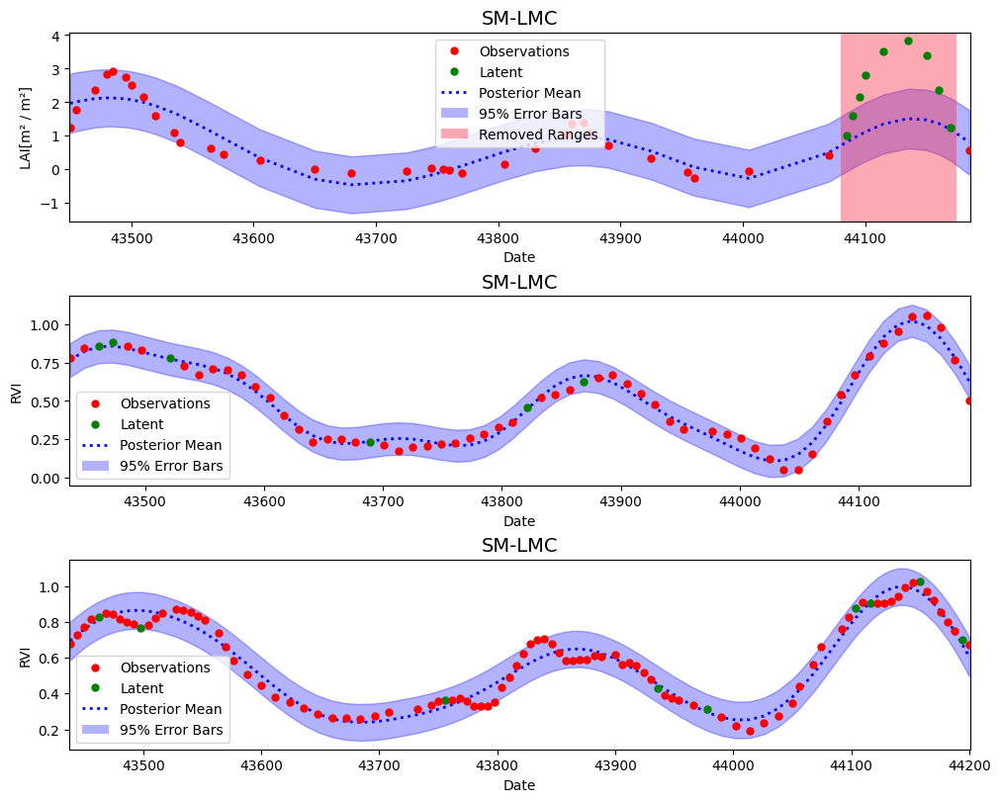

In [ ]:
smlmc_dataset = dataset_S1S2.copy()

start_time = time.time()

smlmc = mogptk.SM_LMC(smlmc_dataset, Q=Q)
smlmc.init_parameters(init_method)

smlmc.train(method=method, lr=lr, iters=iters, verbose=False, error='MAE',plot=True)
smlmc.plot_prediction(title='SM-LMC',figsize=(10,8));

print("--- %s seconds ---" % (time.time() - start_time))

In [ ]:
smlmc_mae = np.zeros((1,nc))
smlmc_rmse = np.zeros((1,nc))
smlmc_mape = np.zeros((1,nc))

smlmc_error = mogptk.error(smlmc, per_channel=True)[0]
smlmc_mae[:] = np.array([item['MAE'] for item in smlmc_error])
smlmc_rmse[:] = np.array([item['RMSE'] for item in smlmc_error])
smlmc_mape[:] = np.array([item['MAPE'] for item in smlmc_error])

mogptk.error(smlmc, disp=True, per_channel=True);
print('\n')

,MAE,MAPE,RMSE
Name,,,
SM-LMC channel 1,1.242541,44.504356,1.471927
SM-LMC channel 2,0.015646,2.593677,0.020232
SM-LMC channel 3,0.036108,5.692113,0.044738


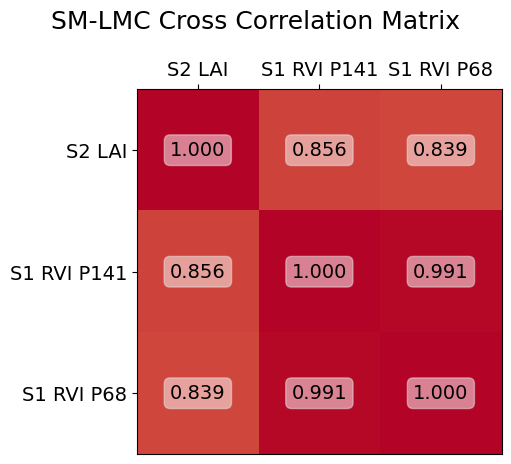

In [ ]:
smlmc.plot_correlation(title='SM-LMC Cross Correlation Matrix',figsize=(5, 5));

###**Convolutional Gaussian kernel**

--- 54.995999574661255 seconds ---


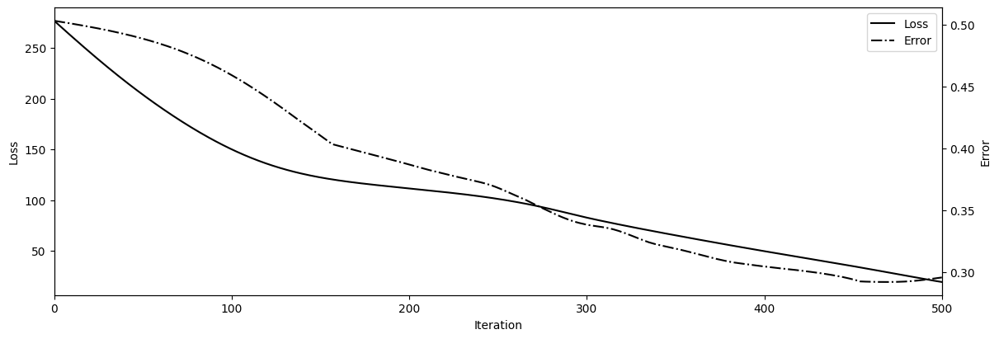

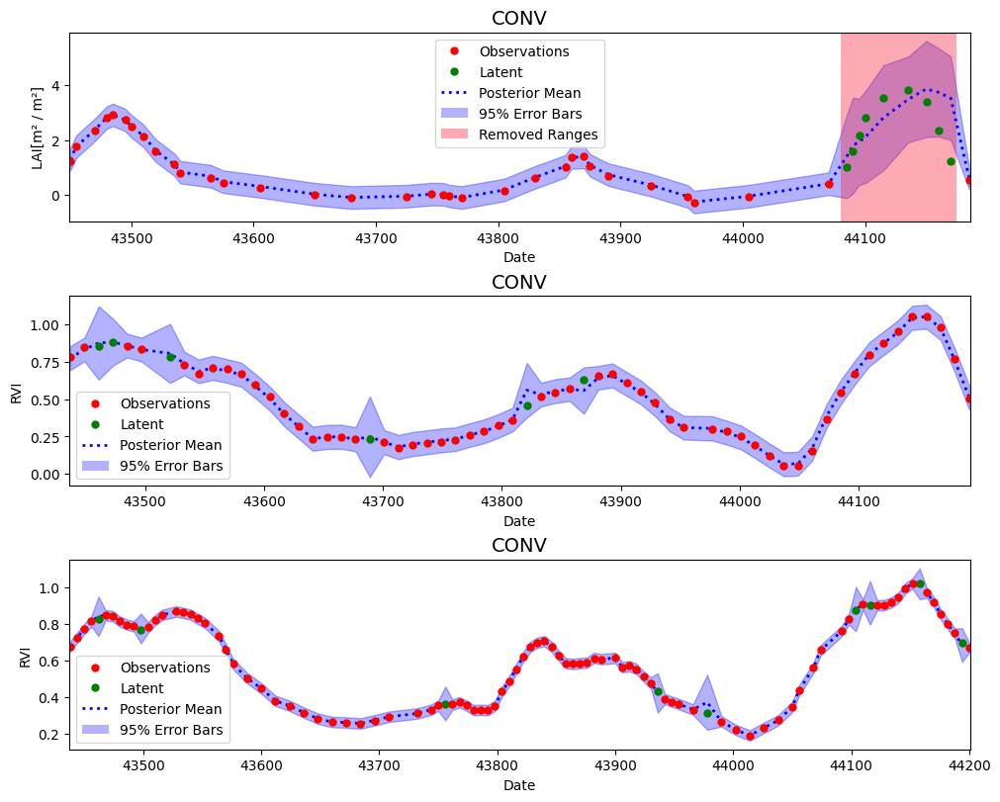

In [ ]:
conv_dataset = dataset_S1S2.copy()

start_time = time.time()

conv = mogptk.CONV(conv_dataset, Q=Q)
conv.init_parameters(init_method)

conv.train(method=method, lr=lr, iters=iters, verbose=False, error='MAE',plot=True,)
conv.plot_prediction(title='CONV',figsize=(10,8));

print("--- %s seconds ---" % (time.time() - start_time))

In [ ]:
conv_mae = np.zeros((1,nc))
conv_rmse = np.zeros((1,nc))
conv_mape = np.zeros((1,nc))

conv_error = mogptk.error(conv, per_channel=True)[0]
conv_mae[:] = np.array([item['MAE'] for item in conv_error])
conv_rmse[:] = np.array([item['RMSE'] for item in conv_error])
conv_mape[:] = np.array([item['MAPE'] for item in conv_error])

mogptk.error(conv, disp=True, per_channel=True);
print('\n')

,MAE,MAPE,RMSE
Name,,,
CONV channel 1,0.748482,41.579574,0.986769
CONV channel 2,0.038938,7.695341,0.052350
CONV channel 3,0.013980,3.133733,0.021528


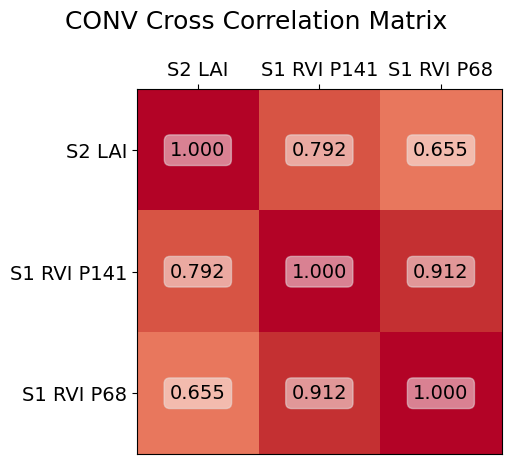

In [ ]:
conv.plot_correlation(title='CONV Cross Correlation Matrix',figsize=(5, 5));

### **Independent spectral mixture kernels**

--- 15.322819232940674 seconds ---


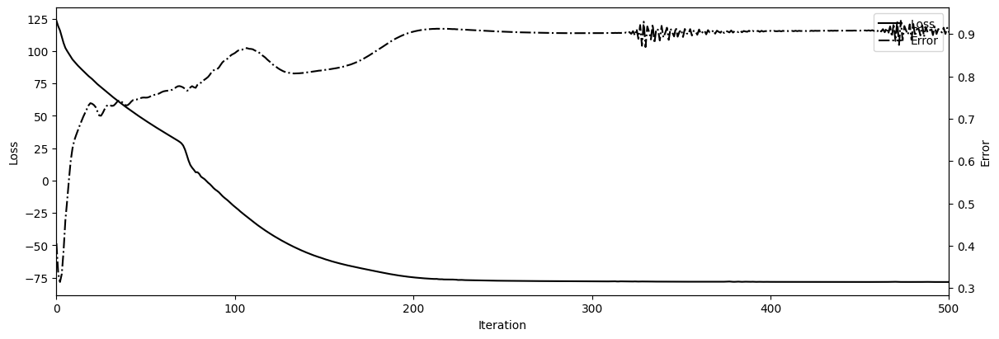

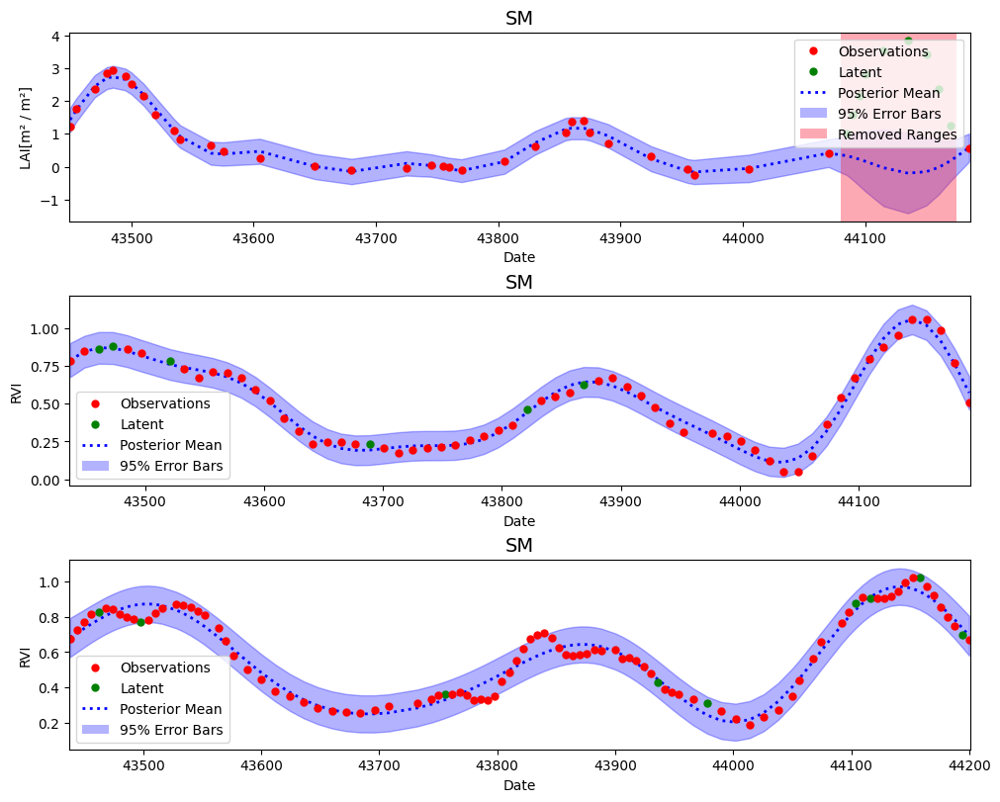

In [ ]:
#valid methods of estimation are IPS, LS, and BNSE

init_method_sm = 'BNSE'
sm_dataset = dataset_S1S2.copy()

start_time = time.time()

sm = mogptk.SM(sm_dataset, Q=Q)
sm.init_parameters(init_method_sm)

sm.train(method=method, lr=lr, iters=iters, verbose=False, error='MAE',plot=True)
sm.plot_prediction(title='SM',figsize=(10,8))

print("--- %s seconds ---" % (time.time() - start_time))

In [ ]:
sm_mae = np.zeros((1,nc))
sm_rmse = np.zeros((1,nc))
sm_mape = np.zeros((1,nc))

sm_error = mogptk.error(sm, per_channel=True)[0]
sm_mae[:] = np.array([item['MAE'] for item in sm_error])
sm_rmse[:] = np.array([item['RMSE'] for item in sm_error])
sm_mape[:] = np.array([item['MAPE'] for item in sm_error])

mogptk.error(sm, disp=True, per_channel=True);
print('\n')

,MAE,MAPE,RMSE
Name,,,
SM channel 1,2.350537,92.217278,2.608719
SM channel 2,0.020129,4.810396,0.021935
SM channel 3,0.046746,7.908362,0.055397


### **MOGPR Results**

In [ ]:
print('RMSE errors per model - General')
print('MOSM:    %g ± %g' % (mosm_rmse.mean(1).mean(), mosm_rmse.mean(1).std()))
print('CSM:     %g ± %g' % (csm_rmse.mean(1).mean(), csm_rmse.mean(1).std()))
print('SM-LMC:  %g ± %g' % (smlmc_rmse.mean(1).mean(), smlmc_rmse.mean(1).std()))
print('CONV:    %g ± %g' % (conv_rmse.mean(1).mean(), conv_rmse.mean(1).std()))
print('SM:      %g ± %g' % (sm_rmse.mean(1).mean(), sm_rmse.mean(1).std()))

print('\n')

print('RMSE errors per model - Channel 0')
print('MOSM:    %g' % (mosm_rmse[0,0]))
print('CSM:     %g' % (csm_rmse[0,0]))
print('SM-LMC:  %g' % (smlmc_rmse[0,0]))
print('CONV:    %g' % (conv_rmse[0,0]))
print('SM:      %g' % (sm_rmse[0,0]))

print('\n')

print('MAE errors per model - Channel 0')
print('MOSM:    %g' % (mosm_mae[0,0]))
print('CSM:     %g' % (csm_mae[0,0]))
print('SM-LMC:  %g' % (smlmc_mae[0,0]))
print('CONV:    %g' % (conv_mae[0,0]))
print('SM:      %g' % (sm_mae[0,0]))

print('\n')

print('MAPE errors per model - Channel 0')
print('MOSM:    %g' % (mosm_mape[0,0]))
print('CSM:     %g' % (csm_mape[0,0]))
print('SM-LMC:  %g' % (smlmc_mape[0,0]))
print('CONV:    %g' % (conv_mape[0,0]))
print('SM:      %g' % (sm_mape[0,0]))

RMSE errors per model - General
MOSM:    0.870879 ± 0
CSM:     0.433275 ± 0
SM-LMC:  0.512299 ± 0
CONV:    0.353549 ± 0
SM:      0.89535 ± 0


RMSE errors per model - Channel 0
MOSM:    2.37759
CSM:     1.20133
SM-LMC:  1.47193
CONV:    0.986769
SM:      2.60872


MAE errors per model - Channel 0
MOSM:    2.13529
CSM:     0.980904
SM-LMC:  1.24254
CONV:    0.748482
SM:      2.35054


MAPE errors per model - Channel 0
MOSM:    83.3355
CSM:     34.1848
SM-LMC:  44.5044
CONV:    41.5796
SM:      92.2173


In [ ]:
pd.DataFrame(np.c_[mosm_mae[0,0],csm_mae[0,0],smlmc_mae[0,0],conv_mae[0,0],sm_mae[0,0]],
             columns=['MOSM-MAE', 'CSM-MAE', 'SM-LMC-MAE', 'CONV-MAE', 'SM-MAE'])

,MOSM-MAE,CSM-MAE,SM-LMC-MAE,CONV-MAE,SM-MAE
0,1.71299,0.685228,0.797779,0.488489,2.064005


In [ ]:
xtest, ytest = dataset_S1S2.get_test_data()
xtrain, ytrain = dataset_S1S2.get_train_data()
tpred = dataset_S1S2.get_prediction_data()
x, y_mean, y_var_lower, y_var_upper = conv.predict(sigma=1)

Recovered Sentinel-2 time series data


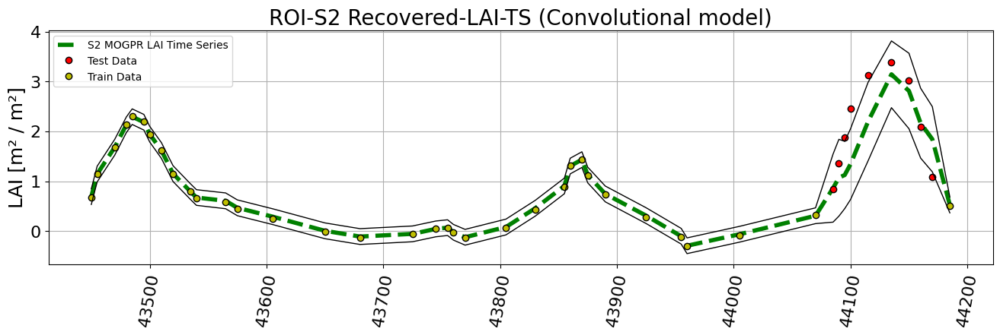

In [ ]:
print('Recovered Sentinel-2 time series data')

plt.figure(figsize= (16,4))
plt.plot(np.asarray(x[0]),y_mean[0],'--g', lw=4)
plt.plot(np.asarray(xtest[0]),ytest[0],linestyle="",marker="o",markerfacecolor='r',markeredgecolor='k',markersize=6, lw=4)
plt.plot(np.asarray(xtrain[0]),ytrain[0],linestyle="",marker="o",markerfacecolor='y',markeredgecolor='k',markersize=6, lw=4)
plt.plot(np.asarray(x[0]),y_var_lower[0],'-k', lw=1)
plt.plot(np.asarray(x[0]),y_var_upper[0],'-k', lw=1)
plt.title('ROI-S2 Recovered-LAI-TS (Convolutional model)',fontsize=20)
plt.ylabel("LAI [m\N{SUPERSCRIPT TWO} / m\N{SUPERSCRIPT TWO}]",fontsize=18)
plt.legend(['S2 MOGPR LAI Time Series','Test Data','Train Data'])
plt.xticks(rotation=80,fontsize=16)
plt.yticks(fontsize=16)
plt.grid(True)
plt.show()

In [ ]:
x, y_mean_mosm, y_var_lower_mosm, y_var_upper_mosm = mosm.predict(sigma=1)
x, y_mean_csm, y_var_lower_csm, y_var_upper_csm = csm.predict(sigma=1)
x, y_mean_sm, y_var_lower_sm, y_var_upper_sm = sm.predict(sigma=1)
x, y_mean_conv, y_var_lower_conv, y_var_upper_conv = conv.predict(sigma=1)
x, y_mean_smlmc, y_var_lower_smlmc, y_var_upper_smlmc = smlmc.predict(sigma=1)

print('S2 time series length',(np.asarray(y_mean_csm[0])).shape)
print('S1 Path 141 time series length',(np.asarray(y_mean_csm[1])).shape)
print('S1 Path 68 time series length',(np.asarray(y_mean_csm[2])).shape)

S2 time series length (43,)
S1 Path 141 time series length (62,)
S1 Path 68 time series length (99,)


In [ ]:
#Numpy array to datetime conversion
#https://stackoverflow.com/questions/19480028/attributeerror-datetime-module-has-no-attribute-strptime

S2_X_test=[None] * xtest[0].shape[0]
for i in range(xtest[0].shape[0]):
  aux = int(xtest[0][i]);
  A = timedelta(days = aux)
  B = A + baseDate
  S2_X_test[i] = B

S2_X_train=[None] * xtrain[0].shape[0]
for i in range(xtrain[0].shape[0]):
  aux = int(xtrain[0][i]);
  A = timedelta(days = aux)
  B = A + baseDate
  S2_X_train[i] = B

Recovered Sentinel-2 time series


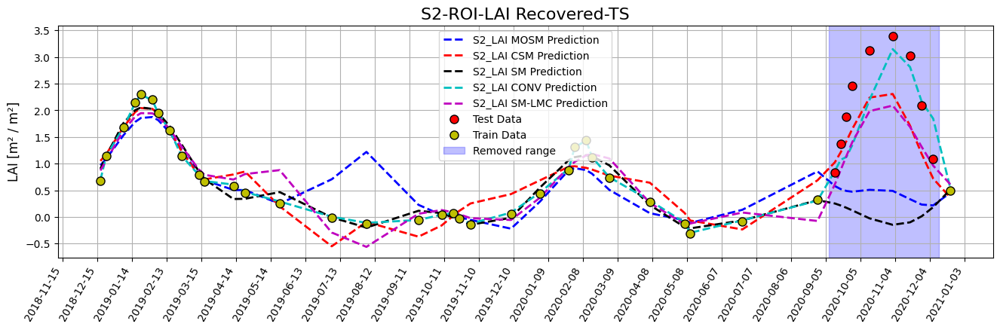

In [ ]:
print('Recovered Sentinel-2 time series')

S2_rem_start_date = timedelta(days = 44080) + baseDate
S2_rem_end_date = timedelta(days = 44175) + baseDate

plt.figure(figsize= (16,4))

ax = plt.axes()
ax.xaxis.set_major_locator(ticker.MultipleLocator(30))
ax.xaxis.set_minor_locator(ticker.MultipleLocator(30))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

plt.plot(Dates_S2,y_mean_mosm[0],'--b', lw=2)
plt.plot(Dates_S2,y_mean_csm[0],'--r', lw=2)
plt.plot(Dates_S2,y_mean_sm[0],'--k', lw=2)
plt.plot(Dates_S2,y_mean_conv[0],'--c', lw=2)
plt.plot(Dates_S2,y_mean_smlmc[0],'--m', lw=2)
plt.plot(S2_X_test,ytest[0],linestyle="",marker="o",markerfacecolor='r',markeredgecolor='k',markersize=8, lw=1)
plt.plot(S2_X_train,ytrain[0],linestyle="",marker="o",markerfacecolor='y',markeredgecolor='k',markersize=8, lw=1)
plt.axvspan(S2_rem_start_date, S2_rem_end_date, alpha=0.25, color='blue')

plt.title('S2-ROI-LAI Recovered-TS',fontsize=16)
plt.ylabel("LAI [m\N{SUPERSCRIPT TWO} / m\N{SUPERSCRIPT TWO}]",fontsize=12)
plt.legend(['S2_LAI MOSM Prediction','S2_LAI CSM Prediction','S2_LAI SM Prediction','S2_LAI CONV Prediction','S2_LAI SM-LMC Prediction','Test Data','Train Data','Removed range'])

plt.xticks(rotation=60,ha='right')
plt.grid(True)
plt.show()

### **WHITTAKER SMOOTHING**

**S1 RVI & S2 LAI arrays reshaping**

In [ ]:
# 20m of spatial resolution

mogpr_in1 = S2_PI_LAI_image_nparray.reshape(S2_PI_LAI_image_nparray.shape[0]*S2_PI_LAI_image_nparray.shape[1], S2_PI_LAI_image_nparray.shape[2])

# 10m of spatial resolution

# mogpr_in1 = S2_PI_LAI_image_10m_nparray.reshape(S2_PI_LAI_image_10m_nparray.shape[0]*S2_PI_LAI_image_10m_nparray.shape[1], S2_PI_LAI_image_10m_nparray.shape[2])

mogpr_in2 = S1_RVI_image_P68_nparray.reshape(S1_RVI_image_P68_nparray.shape[0]* S1_RVI_image_P68_nparray.shape[1], S1_RVI_image_P68_nparray.shape[2])
mogpr_in3 = S1_RVI_image_P141_nparray.reshape(S1_RVI_image_P141_nparray.shape[0]*S1_RVI_image_P141_nparray.shape[1],S1_RVI_image_P141_nparray.shape[2])

print('MOGPR_in1(size):' , mogpr_in1.shape)
print('MOGPR_in2(size):' ,mogpr_in2.shape)
print('MOGPR_in3(size):' ,mogpr_in3.shape)

MOGPR_in1(size): (36, 43)
MOGPR_in2(size): (110, 99)
MOGPR_in3(size): (110, 62)


**Apply the Whittaker smoother to the S1 time series**

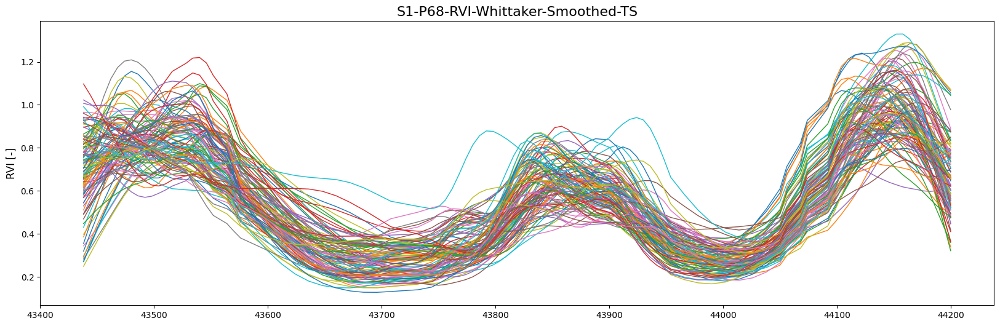

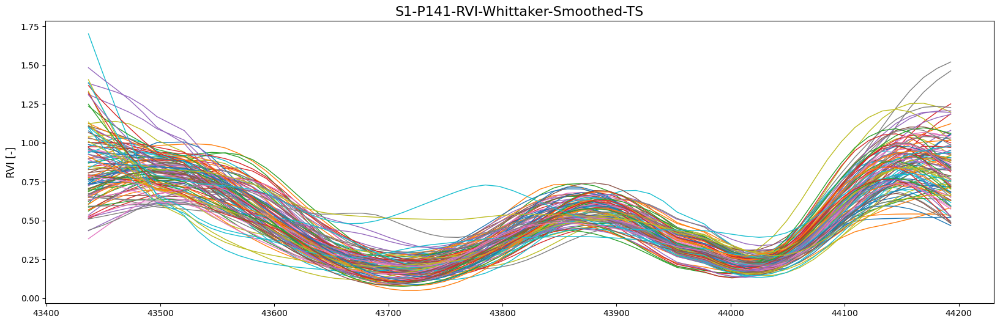

In [ ]:
# create weights for Whittaker smoothing
Y1_Ws = mogpr_in1
Y2_Ws_in = mogpr_in2
Y3_Ws_in = mogpr_in3

w2 =  np.array((S1_RVI_image_P68_nparray_mean!=-3000)*1,dtype='double')
w3 =  np.array((S1_RVI_image_P141_nparray_mean!=-3000)*1,dtype='double')

# Apply Whittaker filter
d = 75

Y2_Ws_out = []
for i in range (Y2_Ws_in.shape[0]):
    y_aux = Y2_Ws_in[i,:]
    YW = ws2d(y_aux,d,w2)
    Y2_Ws_out.append(YW)
Y2_Ws_out = np.array(Y2_Ws_out)

Y3_Ws_out = []
for i in range (Y3_Ws_in.shape[0]):
    y_aux = Y3_Ws_in[i,:]
    YW = ws2d(y_aux,d,w3)
    Y3_Ws_out.append(YW)
Y3_Ws_out = np.array(Y3_Ws_out)

plt.figure(figsize= (20,6))
plt.title('S1-P68-RVI-Whittaker-Smoothed-TS',fontsize=16)
plt.ylabel("RVI [-]",fontsize=12)
for i in range (Y2_Ws_out.shape[0]):
    plt.plot(numericalDates_S1_P68,Y2_Ws_out[i,:], lw=1)

plt.figure(figsize= (20,6))
plt.title('S1-P141-RVI-Whittaker-Smoothed-TS',fontsize=16)
plt.ylabel("RVI [-]",fontsize=12)
for i in range (Y3_Ws_out.shape[0]):
    plt.plot(numericalDates_S1_P141,Y3_Ws_out[i,:], lw=1)

**Create a list of datasets for each pixel within the region of interest (ROI) to train the MOGPR model**

In [ ]:
#Create a list of datasets for MOGPR
dataset_S1S2_Ws_pixels = []
for i in range (Y1_Ws.shape[0]):

    aux_dataset = mogptk.DataSet(mogptk.Data(numericalDates_S2, Y1_Ws[i,:], name='S2 LAI Time Series'),
                                 mogptk.Data(numericalDates_S1_P68, Y2_Ws_out[i,:], name='S1 P68 RVI Time Series'),
                                 mogptk.Data(numericalDates_S1_P141, Y3_Ws_out[i,:], name='S1 P141 RVI Time Series'),

    )
    dataset_S1S2_Ws_pixels.append(aux_dataset)

for i in range (Y1_Ws.shape[0]):
    dataset_S1S2_Ws_pixels[i].transform(mogptk.TransformDetrend(degree=1))
    dataset_S1S2_Ws_pixels[i].transform(TransformStandard())
    dataset_S1S2_Ws_pixels[i].transform(mogptk.TransformNormalize())

# remove second half of the first channel
for i in range (Y1_Ws.shape[0]):
    dataset_S1S2_Ws_pixels[i][0].remove_range(start=44080, end=44175)

**To complete the task, it is necessary to train the MOGPR models for each S1 & S2 dataset**

In [ ]:
#Train model for each pixel in the dataset

global_start_time = time.time()
model_pixel =[]
for i in range (Y1_Ws.shape[0]):
    start_time = time.time()
    aux_model = mogptk.CONV(dataset_S1S2_Ws_pixels[i], Q=Q)
    aux_model.init_parameters(init_method)
    aux_model.train(method=method,iters=300, lr=lr,
          verbose=False, error='MAE', plot=False)
    aux_model.predict()
    model_pixel.append(aux_model)
    print("--- %s seconds ---" % (time.time() - start_time))

print("--- %s seconds ---" % (time.time() - global_start_time))

#Save prediction for each model at pixel level
x = []
y_mean = []
y_var_lower = []
y_var_upper = []

for i in range (Y1_Ws.shape[0]):
    x_aux, y_mean_aux, y_var_lower_aux, y_var_upper_aux = model_pixel[i].predict(sigma=1)
    x.append(x_aux)
    y_mean.append(y_mean_aux)
    y_var_lower.append(y_var_lower_aux)
    y_var_upper.append(y_var_upper_aux)

#Create an image numpy array
A_aux=pd.DataFrame(y_mean)
S2_LAI_recovered =[]
for i in range (Y1_Ws.shape[0]):
    S2_recovered_aux=np.asarray(A_aux[0][i])
    S2_LAI_recovered.append(S2_recovered_aux)

--- 48.9292414188385 seconds ---
--- 38.805598735809326 seconds ---
--- 39.62332820892334 seconds ---
--- 40.02784705162048 seconds ---
--- 41.14589262008667 seconds ---
--- 40.525116205215454 seconds ---
--- 40.74302411079407 seconds ---
--- 40.83366394042969 seconds ---
--- 38.74199032783508 seconds ---
--- 41.89028882980347 seconds ---
--- 39.608837366104126 seconds ---
--- 39.41698908805847 seconds ---
--- 40.10591125488281 seconds ---
--- 39.09445667266846 seconds ---
--- 39.95304346084595 seconds ---
--- 42.06998157501221 seconds ---
--- 39.44341731071472 seconds ---
--- 38.55659747123718 seconds ---
--- 39.66954588890076 seconds ---
--- 38.23481822013855 seconds ---
--- 41.62806248664856 seconds ---
--- 40.26832151412964 seconds ---
--- 38.41089725494385 seconds ---
--- 40.035181283950806 seconds ---
--- 39.567103147506714 seconds ---
--- 38.53314447402954 seconds ---
--- 41.9797580242157 seconds ---
--- 38.220410108566284 seconds ---
--- 39.886823654174805 seconds ---
--- 40.35

**Reshape and save the S2 LAI recovered array**

In [ ]:
# Reshape the S2 LAI recovered array

S2_LAI_recovered_array=np.asarray(S2_LAI_recovered)
S2_LAI_recovered_array_image = S2_LAI_recovered_array.reshape(S2_PI_LAI_image_nparray.shape[0],S2_PI_LAI_image_nparray.shape[1],S2_PI_LAI_image_nparray.shape[2])

#Save the numpy array to Google Drive

file_save_name = 'S2_LAI_recovered_array_image.mat'
file_path = F"/content/drive/My Drive/{file_save_name}"
scipy.io.savemat(file_path, {'data': S2_LAI_recovered_array_image})

**Display the S2-MOGPR LAI recovered time series for each pixel within the analyzed ROI**

Recovered S2 LAI time series (pixel-wise)


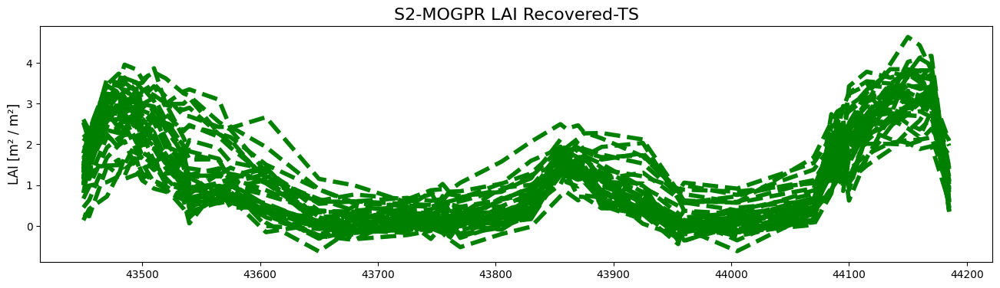

In [ ]:
print('Recovered S2 LAI time series (pixel-wise)')

plt.figure(figsize= (16,4))
plt.title('S2-MOGPR LAI Recovered-TS',fontsize=16)
plt.ylabel("LAI [m\N{SUPERSCRIPT TWO} / m\N{SUPERSCRIPT TWO}]",fontsize=12)
for i in range (Y1_Ws.shape[0]):
    plt.plot(np.asarray(x[i][0]),y_mean[i][0],'--g', lw=4)

**Display the S2 LAI recovered maps for the selected ROI**

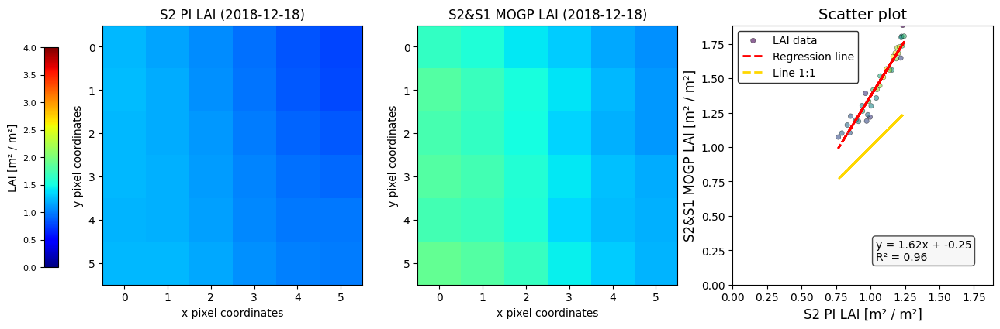

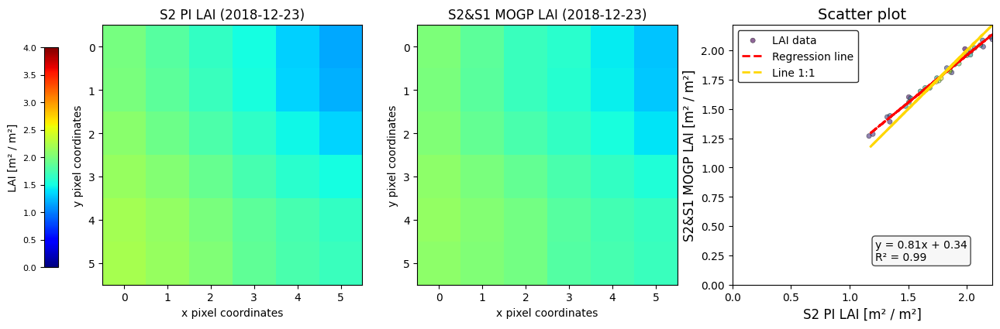

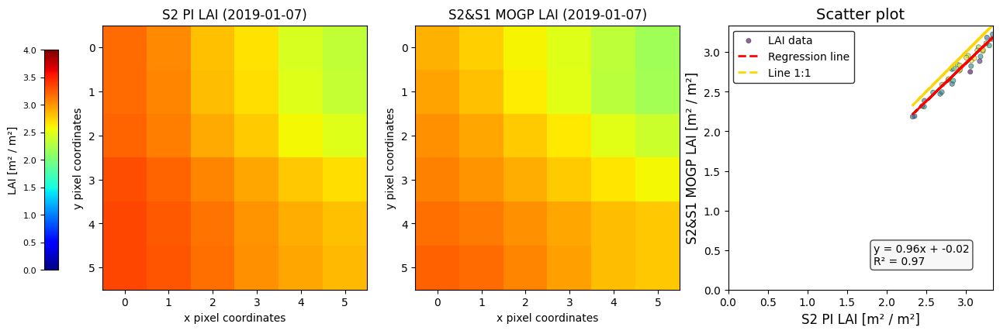

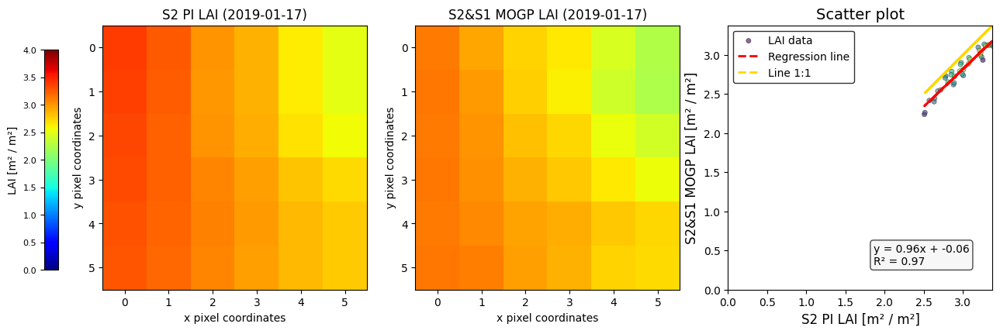

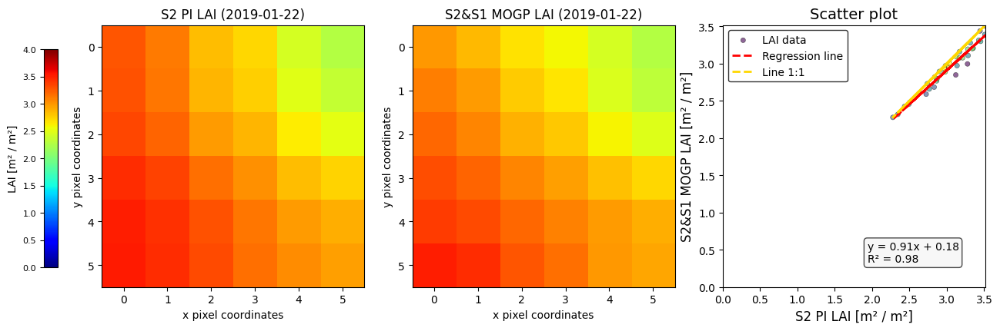

...

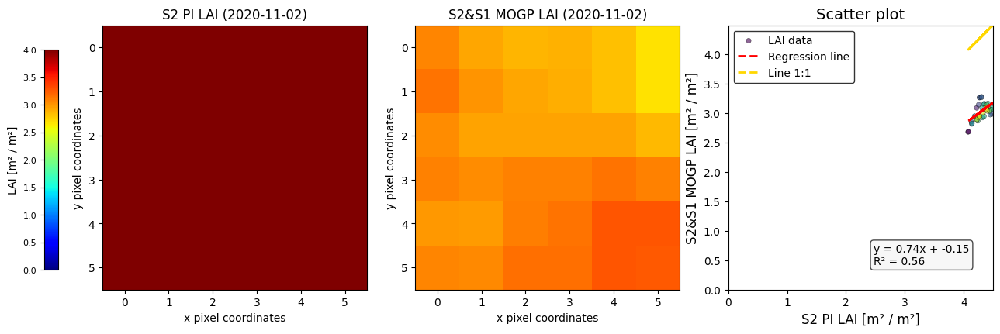

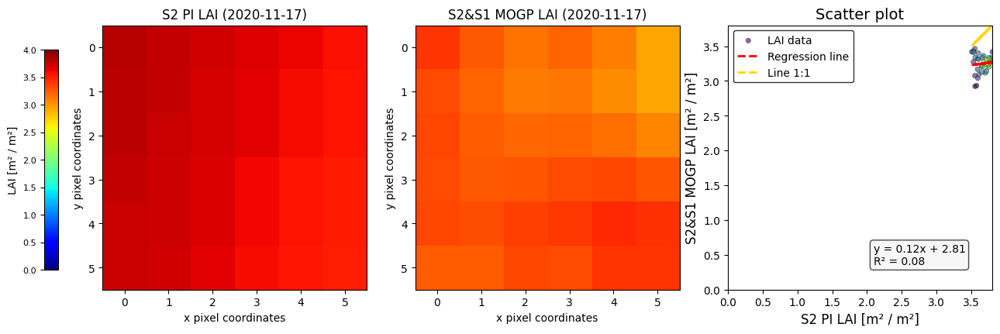

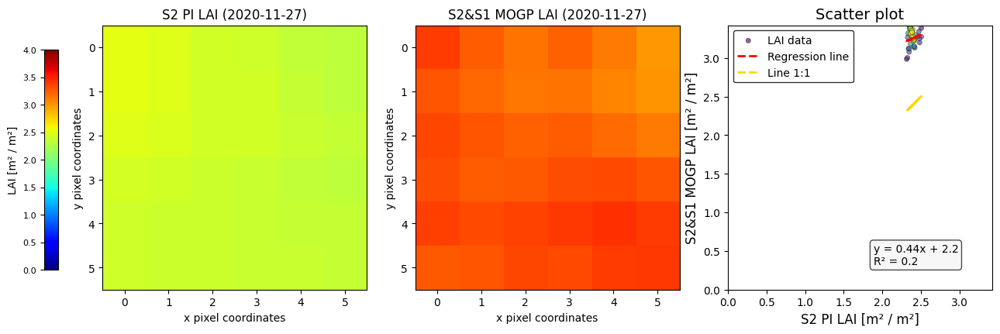

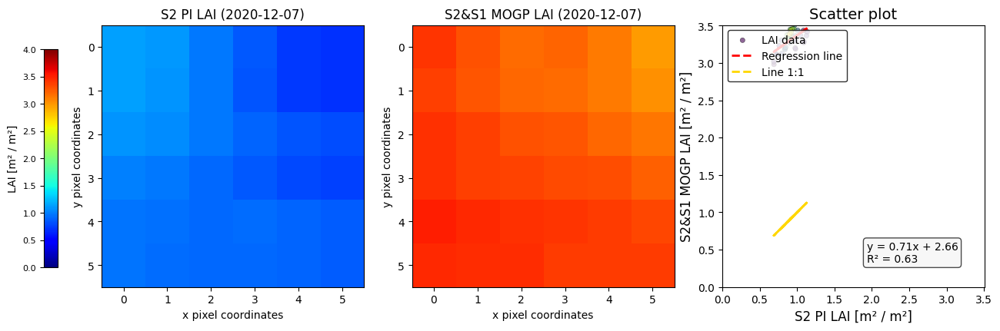

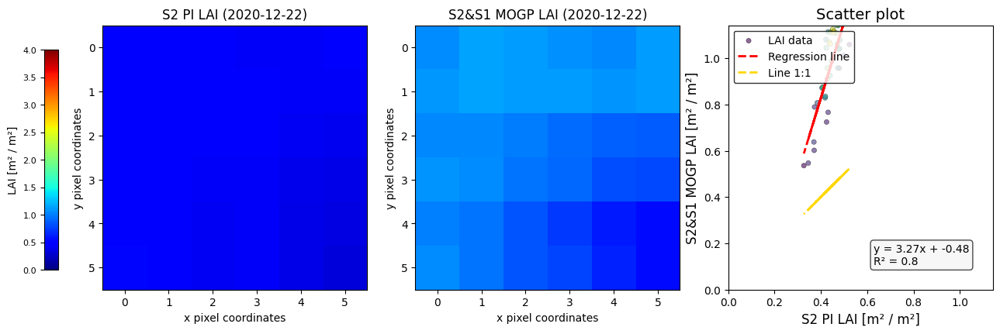

In [ ]:
figure_size = 5
textbox = dict(boxstyle='round', facecolor='whitesmoke', alpha=0.7)

r_value = []
for n in range(S2_PI_LAI_image_nparray.shape[2]):

    rgb_img_test_S2S1 = cv2.blur(S2_LAI_recovered_array_image[:,:,n],(figure_size, figure_size))
    rgb_img_test_S2 = cv2.blur(S2_PI_LAI_image_nparray[:,:,n],(figure_size, figure_size))
    x_scatter = (cv2.blur(S2_PI_LAI_image_nparray[:,:,n],(figure_size, figure_size))).reshape(S2_PI_LAI_image_nparray.shape[0]*S2_PI_LAI_image_nparray.shape[1])
    y_scatter = (cv2.blur(S2_LAI_recovered_array_image[:,:,n],(figure_size, figure_size))).reshape(S2_LAI_recovered_array_image.shape[0]*S2_LAI_recovered_array_image.shape[1])
    m, b, r_value_aux, p_value, std_err = scipy.stats.linregress(x_scatter,y_scatter)

    m = round(m,2)
    b =  round(b,2)
    r_value_aux =  round(r_value_aux ,2)

    fig, ax = plt.subplots(nrows=1, ncols=3,figsize=(12,4),constrained_layout=True,tight_layout=True)

    sc=ax[0].imshow(rgb_img_test_S2,cmap='jet', interpolation='nearest',vmin=0, vmax=4)
    ax[0].set_title('S2 PI LAI ('+ str(Dates_S2[n])+')')
    ax[0].set_xlabel('x pixel coordinates',fontsize=10)
    ax[0].set_ylabel('y pixel coordinates',fontsize=10)

    ax[1].imshow(rgb_img_test_S2S1,cmap='jet', interpolation='nearest',vmin=0, vmax=4),plt.title('S2&S1 MOGPR VWC (filtered)')
    ax[1].set_title('S2&S1 MOGP LAI ('+ str(Dates_S2[n])+')')
    ax[1].set_xlabel('x pixel coordinates',fontsize=10)
    ax[1].set_ylabel('y pixel coordinates',fontsize=10)

    # Calculate the point density
    xy = np.vstack([x_scatter,y_scatter])
    z = gaussian_kde(xy)(xy)

    # Sort the points by density, so that the densest points are plotted last
    idx = z.argsort()
    x_scatter_sort, y_scatter_sort, z = x_scatter[idx], y_scatter[idx], z[idx]

    ax[2].scatter(x_scatter_sort, y_scatter_sort,c=z, s=20, edgecolors = "black", linewidths = 0.4, alpha = 0.6)
    ax[2].plot(x_scatter, m*x_scatter + b,'--',color='red',lw=2),
    ax[2].plot(x_scatter, x_scatter,'--',color='gold',lw=2),

    ax[2].legend(['LAI data','Regression line','Line 1:1'], loc='upper left',facecolor='white',edgecolor='black')
    text_aux  = "y = {:.4g}x + {:.4g}\nR\N{SUPERSCRIPT TWO} = {:.4g}"
    ax[2].text(0.55, 0.175,text_aux.format(m,b,r_value_aux),transform=ax[2].transAxes, fontsize=10, verticalalignment='top', bbox=textbox)
    ax[2].set_xlabel("S2 PI LAI [m\N{SUPERSCRIPT TWO} / m\N{SUPERSCRIPT TWO}]",fontsize=12)
    ax[2].set_ylabel("S2&S1 MOGP LAI [m\N{SUPERSCRIPT TWO} / m\N{SUPERSCRIPT TWO}]",fontsize=12)
    ax[2].set_title('Scatter plot',fontsize=14)
    ax[2].set_aspect('equal', 'box')

    box_max = np.maximum.reduce([x_scatter,y_scatter], axis=(1,0))
    box_min = np.minimum.reduce([x_scatter,y_scatter], axis=(1,0))

    ax[2].set_xlim(left=0, right=box_max)
    ax[2].set_ylim(bottom=0, top= box_max)
    ax[2].set_box_aspect(1)

    fig.tight_layout(pad=0.5)
    cbar_ax = fig.add_axes([-0.025, 0.1675, 0.015, 0.71])
    cbar_ax.tick_params(labelsize=8)
    fig.colorbar(sc, cax=cbar_ax,label='LAI [m\N{SUPERSCRIPT TWO} / m\N{SUPERSCRIPT TWO}]',ticklocation='left')
    insert_name = "S2_LAI_image_nparray_filtered"
    fig.savefig('/content/drive/My Drive/'+ insert_name + str(Dates_S2[n])+'.png', bbox_inches='tight')
    r_value.append(r_value_aux)